<h1><b>M5 Forecasting: Exploratory Data Analysis</b></h1>

# **Contents**

<h3> 1. Load and Extract Data </h3> 

<h3> 2. Reading the Data </h3> 

<h3> 3. Downcasting Dataframes</h3> 

<h3> 4. Exploring Time Series Data</h3> 
 
<h3> 5. References</h3> 



In [ ]:
#import dependencies
from zipfile import ZipFile 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# 1. Load and Extract Data 

## 1.1 Loading Data from Kaggle

In [ ]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/105.0.0.0 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/18599/1236839/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1664526184&Signature=GHH6LyWP5ajWHiABf0eCeNXg%2BfY4LPzkkADhNQMcBZrei2QhFhCWSeGGoK1T7FnHBdZlFtfeAP8ZYqwCk78nazIbcZnCG3Q7k62jF5j7%2FRF5XNSTu8x1hvI2CAaqLs2QqLyaBg5lP9aBlHaczvCkk4A6S3106uKWl9hB6J7O%2F3HuxxlcarvCfs6J9NFpvFahuExXT8OixMlgraceafI9Q2jq80w%2BZuqbZv2PNld5He7KETfIbRl%2FkerEn7TGYGtEufmGf4cTON63VbkcK6d56P%2B6H7EMjmh3kd5mQba8l1RnETN86kjDsBoQYipeyGM3qQawidzBimrUqvZ8cAf9Lw%3D%3D&response-content-disposition=attachment%3B+filename%3Dm5-forecasting-accuracy.zip" -c -O 'm5-forecasting-accuracy.zip'

--2022-09-28 19:43:49--  https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/18599/1236839/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1664526184&Signature=GHH6LyWP5ajWHiABf0eCeNXg%2BfY4LPzkkADhNQMcBZrei2QhFhCWSeGGoK1T7FnHBdZlFtfeAP8ZYqwCk78nazIbcZnCG3Q7k62jF5j7%2FRF5XNSTu8x1hvI2CAaqLs2QqLyaBg5lP9aBlHaczvCkk4A6S3106uKWl9hB6J7O%2F3HuxxlcarvCfs6J9NFpvFahuExXT8OixMlgraceafI9Q2jq80w%2BZuqbZv2PNld5He7KETfIbRl%2FkerEn7TGYGtEufmGf4cTON63VbkcK6d56P%2B6H7EMjmh3kd5mQba8l1RnETN86kjDsBoQYipeyGM3qQawidzBimrUqvZ8cAf9Lw%3D%3D&response-content-disposition=attachment%3B+filename%3Dm5-forecasting-accuracy.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.152.128, 142.250.128.128, 142.251.6.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.152.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 48009163 (46M) [application/zip]
Saving to: ‘m5-forecasting-accuracy.zip’

m

## 1.2 Extracting Data from Zip

In [ ]:
with ZipFile('/content/m5-forecasting-accuracy.zip') as z: 
    z.extractall()

# 2. Reading the Data

## 2.1 Sales Data

In [ ]:
df_sales = pd.read_csv('/content/sales_train_validation.csv')
print(df_sales.shape)
df_sales.head()

(30490, 1919)


,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


## 2.2 Calendar Data

In [ ]:
df_cal = pd.read_csv('/content/calendar.csv') 
print(df_cal.shape)
df_cal.head()

(1969, 14)


,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [ ]:
df_cal['event_name_1'] = df_cal['event_name_1'].apply(lambda x: "".join(x.split(" ")) if type(x)==str else x)
df_cal['event_name_2'] = df_cal['event_name_2'].apply(lambda x: "".join(x.split(" ")) if type(x)==str else x)

df_cal['event_name'] = df_cal[['event_name_1', 'event_name_2']].apply(lambda x: "_".join([x[0], x[1]]) if type(x[1])==str else x[0], axis=1)
df_cal['event_type'] = df_cal[['event_type_1', 'event_type_2']].apply(lambda x: "_".join([x[0], x[1]]) if type(x[1])==str else x[0], axis=1)

df_cal.drop(columns=['event_name_1', 'event_type_1', 'event_name_2', 'event_type_2'], inplace=True)
df_cal['event_name'].fillna('NoEvent', inplace=True)
df_cal['event_type'].fillna('NoEvent', inplace=True)
df_cal.head()

,date,wm_yr_wk,weekday,wday,month,year,d,snap_CA,snap_TX,snap_WI,event_name,event_type
0,2011-01-29,11101,Saturday,1,1,2011,d_1,0,0,0,NoEvent,NoEvent
1,2011-01-30,11101,Sunday,2,1,2011,d_2,0,0,0,NoEvent,NoEvent
2,2011-01-31,11101,Monday,3,1,2011,d_3,0,0,0,NoEvent,NoEvent
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,1,1,0,NoEvent,NoEvent
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,1,0,1,NoEvent,NoEvent


## 2.3 Sell Price Data

In [ ]:
df_price = pd.read_csv('/content/sell_prices.csv')
print(df_price.shape)
df_price.head()

(6841121, 4)


,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58
2,CA_1,HOBBIES_1_001,11327,8.26
3,CA_1,HOBBIES_1_001,11328,8.26
4,CA_1,HOBBIES_1_001,11329,8.26


# 3. Downcasting Dataframes

In [ ]:
#code snippet taken from - https://stackoverflow.com/questions/5194057/better-way-to-convert-file-sizes-in-python
import math

def convert_size(size_bytes):
   if size_bytes == 0:
       return "0B"
   size_name = ("B", "KB", "MB", "GB", "TB", "PB", "EB", "ZB", "YB")
   i = int(math.floor(math.log(size_bytes, 1024)))
   p = math.pow(1024, i)
   s = round(size_bytes / p, 2)
   return "%s %s" % (s, size_name[i])

In [ ]:
#refer to get range of datatypes - https://stackoverflow.com/questions/1658714/how-to-get-the-range-of-valid-numpy-data-types
def downcast(data):
    cols = data.columns
    for col in cols:
        if data[col].dtype == object:
            if col =='date':
                data[col] = pd.to_datetime(data[col])
            else: 
                data[col] = data[col].astype('category') #not too necessary we can keep it as object 

        #instead of uint we may also keep as uint8/16/32/64 but uint is better for now  
        #only check the upper value to 
        elif data[col].dtype == int: 
            if data[col].max() < np.iinfo('int8').max:
                data[col] = data[col].astype('int8')

            elif data[col].max() < np.iinfo('int16').max:
                data[col] = data[col].astype('int16')

            elif data[col].max() < np.iinfo('int32').max:
                data[col] = data[col].astype('int32')
            else:
                data[col] = data[col].astype('int64')

        elif data[col].dtype == float:
            if data[col].max() < np.finfo('float16').max:
                data[col] = data[col].astype('float16')
            elif data[col].max() < np.finfo('float32').max:
                data[col] = data[col].astype('float32')
            else:
                data[col] = data[col].astype('float64')

    return data

In [ ]:
# dataframes memory usage before downcasting
sales_mem_before = convert_size(df_sales.memory_usage().sum())
cal_mem_before = convert_size(df_cal.memory_usage().sum())
price_mem_before = convert_size(df_price.memory_usage().sum())

In [ ]:
%%time
df_sales = downcast(df_sales)
df_cal = downcast(df_cal)
df_price = downcast(df_price)

CPU times: user 1min 54s, sys: 3.79 s, total: 1min 58s
Wall time: 2min 2s


In [ ]:
# dataframes memory usage after downcasting
sales_mem_after = convert_size(df_sales.memory_usage().sum())
cal_mem_after = convert_size(df_cal.memory_usage().sum())
price_mem_after = convert_size(df_price.memory_usage().sum())

In [ ]:
from prettytable import PrettyTable

# effect of downcasting
x = PrettyTable()

x.field_names = ["Dataframe", "Before Downcasting", "After Downcasting"]
x.add_rows(
    [
        ["Sales", sales_mem_before, sales_mem_after],
        ["Calendar", cal_mem_before, cal_mem_after],
        ["Price", price_mem_before, price_mem_after]
    ]
)
print(x)

+-----------+--------------------+-------------------+
| Dataframe | Before Downcasting | After Downcasting |
+-----------+--------------------+-------------------+
|   Sales   |      446.4 MB      |      95.16 MB     |
|  Calendar |     184.72 KB      |     124.37 KB     |
|   Price   |     208.77 MB      |      45.76 MB     |
+-----------+--------------------+-------------------+


# 4. Exploratory Data Analysis

## 4.1 Visualizing Heirarchical Nature of Data

In [ ]:
fig = px.sunburst(df_sales, path=['state_id', 'store_id', 'cat_id', 'dept_id'], color='state_id')
fig.update_layout(title_text="4-level Sunburst Diagram", font_size=12, margin=dict(l=20, r=20, t=50, b=20),paper_bgcolor="cornsilk")
fig.show()

- The above diagram depicts the heirarchical structure of the data: State -> Store -> Category -> Department (-> Items, there are items in each department)
- There are in total 12 aggregation levels including the fundamental blocks (State, Store, Category, Department) and their combinations. 
- Each aggregation level consists a certain number of Time Series for instance State level consists of 3 Time Series Sales Data corresponding to each unique state present in the data namely CA, TX, WI. 
- The total number of Time Series across all the levels is 42840.
- The table below elaborates on each aggregation level. 

(credits - https://www.researchgate.net/publication/344487258_The_M5_Accuracy_competition_Results_findings_and_conclusions)

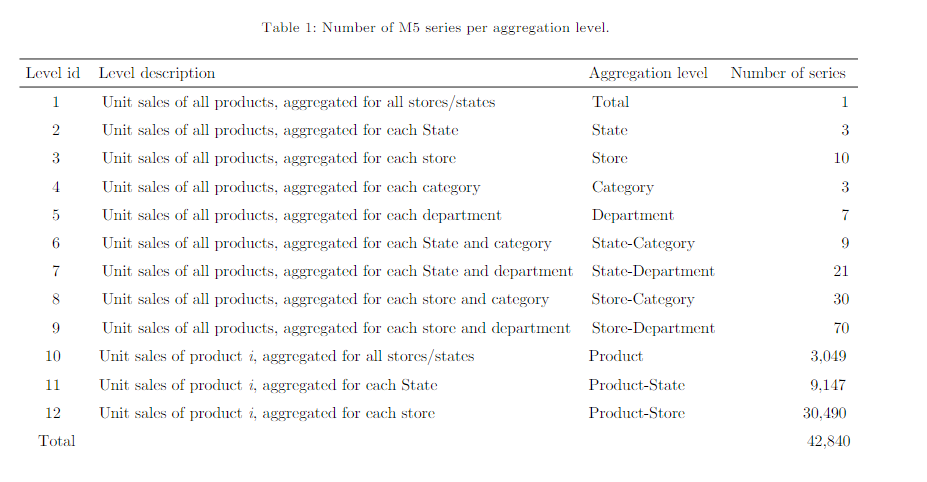

## 4.2 Visualizing Distribution of Categories at Different Levels

In [ ]:
query_df = pd.DataFrame(np.unique(df_sales['item_id']), columns=['item_id'])
query_df['cat_id'] = query_df['item_id'].apply(lambda x: x.split('_')[0])
query_df['dept_id'] = query_df['item_id'].apply(lambda x: "_".join(x.split('_')[:2]))
query_df.head()

,item_id,cat_id,dept_id
0,FOODS_1_001,FOODS,FOODS_1
1,FOODS_1_002,FOODS,FOODS_1
2,FOODS_1_003,FOODS,FOODS_1
3,FOODS_1_004,FOODS,FOODS_1
4,FOODS_1_005,FOODS,FOODS_1


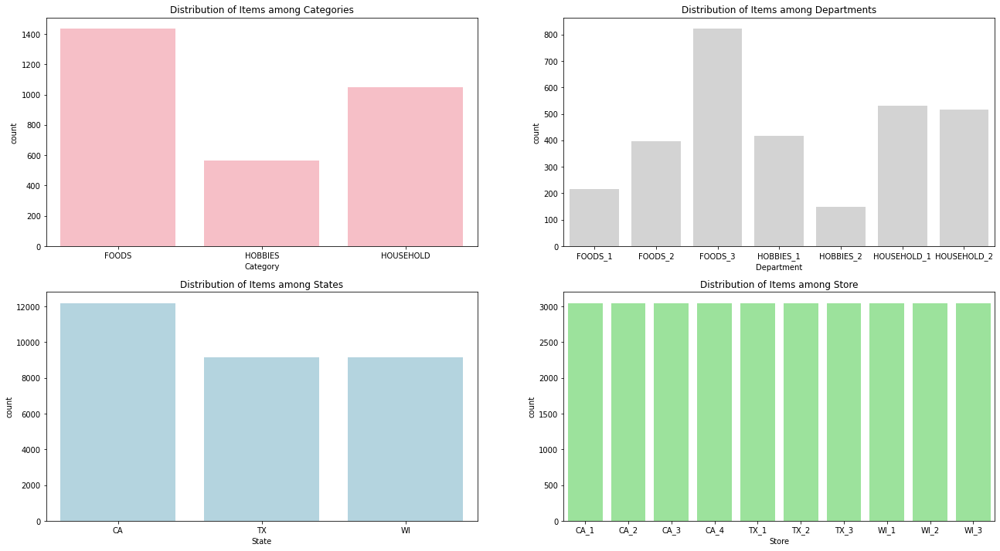

In [ ]:
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize=(22,12))
sns.countplot(data = query_df, x = 'cat_id', color='lightpink', ax=ax[0][0])
ax[0][0].set(title = 'Distribution of Items among Categories', xlabel = 'Category')

sns.countplot(data = query_df, x = 'dept_id', color='lightgrey', ax=ax[0][1])
ax[0][1].set(title = 'Distribution of Items among Departments', xlabel = 'Department')

sns.countplot(data = df_sales, x = 'state_id', color='lightblue', ax=ax[1][0])
ax[1][0].set(title = 'Distribution of Items among States', xlabel = 'State')

sns.countplot(data = df_sales, x = 'store_id',color='lightgreen', ax=ax[1][1])
ax[1][1].set(title = 'Distribution of Items among Stores', xlabel = 'Store')
plt.show()

Observations:

Note - There are 3049 unique products distributed across different departments/categories, we use the query_df to understand this distribution. For understanding product distribution among stores/states we use df_sales.

> Category:
- 46% of the items belong to FOODS Category (most) which makes sense as most people usually visit supermarkets for grocery shopping therefore supermarkets tend to keep more variety of food items to meet consumer demand. 
- Followed by HOUSEHOLD items which contribute 35% of the items which implies that for consumers household shopping is on next priority which is why supermarkets may keep more variety in this section. 
- 19% of the items belong to HOBBIES Category (least) which implies that probably most consumers tend not to buy much stuff from this section. 

> Department:
- 26% of the items belong to FOODS_3 department which is the highest.
- Followed by HOUSEHOLD_1 and HOUSEHOLD_2 which consist of nearly 16% of items each
- HOBBIES_2 consist of the least number of items which is nearly 3%.

> State and Store:
- There are 3049 unique products in total
- Each of the stores houses these 3049 unique products. 
- There is an extra store in California that's why it has the highest number of items which is 40%. 

## 4.3 Visualizing Sales Data on Different Levels

**Understanding basic terms before EDA.**

Difference between Seasonality and Cyclicity:
- Seasonality is a characteristic of a time series in which the data experiences regular and predictable changes that recur every calendar year.
- Seasonal effects are different from cyclical effects, as seasonal cycles are observed within one calendar year, while cyclical effects, such as boosted sales due to low unemployment rates, can span time periods shorter or longer than one calendar year.
- In time series, any periodic variation may be described as a cycle. Often, however, the term is reserved for cycles generated by the autoregressive structure of the series, as opposed to seasonal variation, caused by outside influences.
- In cyclical there are peaks and troughs but the time intervals between two consecutuve peaks or troughs may be irregular. - https://www.youtube.com/watch?v=ca0rDWo7IpI (6:00 min)

In [ ]:
def query(sales_data, sales_col, cal_data, cal_col):
    ''' Returns a dataframe which represents sum of sales w.r.t time (days) on different aggregated levels '''

    query_df = sales_data.groupby(by=sales_col).sum().T 
    query_df.index = cal_data[cal_col][:1913] 

    return query_df

def totalSales(df, level):
    ''' Returns a 2D plotly graph which represents Date on x-axis and Items Sold(Sales) on y-axis '''

    cols = df.columns.tolist()
    fig = go.Figure()
    for col in cols:
        fig.add_trace(go.Scatter(x=df.index, y=df[col], mode='lines', name=col, 
                             hovertemplate=level+"=%s<br>Day=%%{x}<br>Items Sold=%%{y}<extra></extra>"%col))
    fig.update_xaxes(
        title_text="Date",
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )
    fig.update_yaxes(title_text="Items Sold")
    fig.update_layout(title = f'Total Sales by {level}',  legend_title_text = level, paper_bgcolor="cornsilk")

    return fig.show()

def rollingAvgPlots(df, window, fig, row, col, level, lgroup):
    ''' Returns a Time Series Sales Curve Smoothed by Rolling Average with Date on x-axis and Average Items Sold(Sales) on y-axis '''

    roll = df.rolling(window).mean()

    for colname in roll.columns:
        fig.add_trace(go.Scatter(x=roll.index, y=roll[colname], mode='lines', name=colname, 
                            hovertemplate=level+"=%s<br>Day=%%{x}<br>Items Sold=%%{y}<extra></extra>"%colname, legendgroup= lgroup),
                            row= row, col= col)
    fig.update_xaxes(title_text="Date")
    fig.update_yaxes(title_text="Items Sold")

def rollingAvgSales(df, level):
    ''' Returns a Multiple Time Series Sales Curves Smoothed by Rolling Average of different Time Windows with Date on x-axis and Average Items Sold(Sales) on y-axis '''

    fig = make_subplots(rows=3, cols=2, start_cell="bottom-left", subplot_titles=("Rolling Average Time Window = 7", "Rolling Average Time Window = 14", 
                                                                                  "Rolling Average Time Window = 28", "Rolling Average Time Window = 60",
                                                                                  "Rolling Average Time Window = 90", "Rolling Average Time Window = 120"))
    windows = [7, 14, 28, 60, 90, 120]
    windows_gen = (y for y in windows)
    lgroup = (y for y in range(1,7))

    for row in range(1,4):
        for col in range(1,3):
            rollingAvgPlots(df, next(windows_gen), fig, row, col, level,  next(lgroup))

    fig.update_layout(title = f'Rolling Average Sales by {level}', legend_title_text = level, paper_bgcolor="ivory")
    fig.update_annotations(font_size=12)

    return fig.show()

### 4.3.0 Country Level (All) 

In [ ]:
query_df = query(df_sales, 'state_id', df_cal, 'date')
query_df = pd.DataFrame(query_df.sum(axis=1), columns=['all'])
query_df.head(3)

,all
date,
2011-01-29,32631.0
2011-01-30,31749.0
2011-01-31,23783.0


In [ ]:
totalSales(query_df, 'all')

Observations: 
- The sales dips to its lowest point for each State on 25th December which is Christmas every year this indicates a seasonality component in the Time Series.

In [ ]:
rollingAvgSales(query_df, 'all')

Observations: 
- Rolling Average Sales Curve follows an upward trend with some seasonality component observed when Time Window is 90 days. 
- The curve peaks twice every year with different magnitude first in April-May and second in September-October with a higher magnitude.

### 4.3.1 State Level


In [ ]:
query_df = query(df_sales, 'state_id', df_cal, 'date')
query_df.head(3)

state_id,CA,TX,WI
date,,,
2011-01-29,14195.0,9438.0,8998.0
2011-01-30,13805.0,9630.0,8314.0
2011-01-31,10108.0,6778.0,6897.0


In [ ]:
totalSales(query_df, 'State')

Observations: 
- Overall CA sales outperforms TX, WI throughout the entire period which is purely logical as there are 4 stores in CA as compared TX, WI which have 3 stores each.
- TX and WI sales are mostly head to head throughout the entire period.
- There is a spike in TX sales on 15th June, 2015 where it surpassed even CA sales by a margin of 1.89K units. This implies there can be some big event in around that date. Also, this is the peak sales (i.e. 18.73K units) which the state of TX saw.  
- Upon investigating further, we found that one of the major events that took place in TX around 15th June 2015 was major parts of TX being hit by Tropical Storm Bill which could be a reason for such spike in sales. (credit - https://weather.com/storms/hurricane/news/tropical-storm-bill-flooding-heavy-rain-threat) 

In [ ]:
rollingAvgSales(query_df, 'State')

Observations:
- Time Series Rolling Average Sales Curve in all 3 states follows an upward trend in general. 
- There is a Seasonal pattern observed where in sales peak in a specific period which is between July-October (~3rd Quarter) every year. 
- An upward trend with seasonality is observed in all 3 Time Series. 
- WI surpasses TX sales for January-March (1st quarter) every year from 2013-2016. 
- Overall the Average Sales in WI and TX overlap for the majority of Time Series.

### 4.3.2 Store Level

In [ ]:
query_df = query(df_sales, 'store_id', df_cal, 'date')
query_df.head(3)

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
date,,,,,,,,,,
2011-01-29,4337.0,3494.0,4739.0,1625.0,2556.0,3852.0,3030.0,2704.0,2256.0,4038.0
2011-01-30,4155.0,3046.0,4827.0,1777.0,2687.0,3937.0,3006.0,2194.0,1922.0,4198.0
2011-01-31,2816.0,2121.0,3785.0,1386.0,1822.0,2731.0,2225.0,1562.0,2018.0,3317.0


In [ ]:
totalSales(query_df, 'Store')

Observations: 
- CA_3, TX_2 and WI_3 are the top performing stores in different states. CA_4, TX_1 and WI_1 are the least performing stores.
- The sales on 24th Mar'2015 in TX_2 Store is unbelievably low however the other TX stores did considerable sales, probably due to some major event. The sales show a sudden spike the next day with 4525% increase from the previous day.
- The sales on 2nd Feb'2011 in WI_3 Store is unbelievably low however the other WI stores did considerable sales, probably due to some major event.
- Upon further investigation, we found that a Blizzard hit some parts of WI on 2nd Feb'2011 which could be a potential reason for low sales in only 1 of the store in WI. (credit - https://www.fox6now.com/weather/remember-the-blizzard-of-2011-some-parts-of-se-wisconsin-saw-more-than-2-feet-of-snow)


In [ ]:
rollingAvgSales(query_df, 'Store')

Observations:

- CA_3 shows an upward trend with seasonality where in sales peak in a specific period which is between July-October (~3rd Quarter) every year. 
- It is difficult to observe patterns in Time Series of other stores due to a lot of overlap.

### 4.3.3 Product Category Level

In [ ]:
query_df = query(df_sales, 'cat_id', df_cal, 'date')
query_df.head(3)

cat_id,FOODS,HOBBIES,HOUSEHOLD
date,,,
2011-01-29,23178.0,3764.0,5689.0
2011-01-30,22758.0,3357.0,5634.0
2011-01-31,17174.0,2682.0,3927.0


In [ ]:
totalSales(query_df, 'Category')

Observations:
- FOODS category has the highest sales throughout the entire period followed by HOUSEHOLD and then HOBBIES which is the lowest.
- This implies that most consumers pay a visit for grocery shopping primarily.

In [ ]:
rollingAvgSales(query_df, 'Category')

Observations:
- FOODS category follows an upward trend with seasonality where in sales peak in a specific period which is between July-October (around 3rd Quarter) every year except for the first year.
- HOUSEHOLD category follows a slight upward trend however there is no seasonal pattern observed here. 
- HOBBIES category follows a stable trend throughout the entire period.

### 4.3.4 Department Level

In [ ]:
query_df = query(df_sales, 'dept_id', df_cal, 'date')
query_df.head(3)

dept_id,FOODS_1,FOODS_2,FOODS_3,HOBBIES_1,HOBBIES_2,HOUSEHOLD_1,HOUSEHOLD_2
date,,,,,,,
2011-01-29,2343.0,4094.0,16741.0,3610.0,154.0,4105.0,1584.0
2011-01-30,2216.0,4209.0,16333.0,3172.0,185.0,3858.0,1776.0
2011-01-31,1657.0,3174.0,12343.0,2497.0,185.0,2827.0,1100.0


In [ ]:
totalSales(query_df, 'Department')

Observations: 
- FOODS_3 department has the highest unit sales throughout the entire period which probably means that the products in this department could be basic necessary food items which are consumed by almost every customer. 
- HOUSEHOLD_1 department has the second highest unit sales from Mar'2012 onwards same logic as above applies here. 
- HOBBIES_2 department has the lowest unit sales throughout the entire period implying that probably this department consists of expensive products which regular public doesn't intend to invest in considering the fact that on the other hand HOBBIES_1 department is making significant sales. 

In [ ]:
rollingAvgSales(query_df, 'Department')

Observations: 
- FOODS_3 department follows an upward trend with seasonality where in sales peak in a specific period which is between July-October (around 3rd Quarter) every year except for the first year.
- HOUSEHOLD_1 department follows a slight upward trend however there is no seasonal pattern observed here. 
- FOODS_2 department might be following a very slight upward trend and there's a seasonality component which can be observed at rolling window={7, 14} where in the sales spike around the 15th day of every month throughout the entire time series. 
- HOBBIES_2, FOODS_1,  HOUSEHOLD_2 departments follows a stable trend without any significant seasonality component.

## 4.3.5 Item Level
- We cannot obeserve Time Series of each and every item. So, we pick a random item from each category and observe its sales data as a whole or among states/stores. 

- There are 3049 items in total and below is the breakup of the number of items distributed among different categories.

In [ ]:
df_sales[df_sales['store_id']=='CA_1']['cat_id'].value_counts()

FOODS        1437
HOUSEHOLD    1047
HOBBIES       565
Name: cat_id, dtype: int64

In [ ]:
query_df = df_sales[df_sales['item_id']=='HOBBIES_1_002'].sum(axis=0)
query_df = pd.DataFrame(query_df)
query_df.index = df_cal['date'].iloc[:1913]
query_df.tail(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,0
date,
2016-04-22,2
2016-04-23,3
2016-04-24,6


In [ ]:
totalSales(query_df, 'Item')

Observations: 
- HOBBIES_1_002 product's sales curve follows a stable trend with a seasonality component in effect where in the sales peaks every year in December around Christmas. 
- No units were sold in the following periods: 29th Jan'2011 to 4th Mar'2011 and 20th Mar'2011 to 18th Jun'2011, implying that the market testing was done in Mar'2011 for a few days and then based on customer sentiment the product launch happened in Jun'2011.
- 24 units sold on 24th Dec'2014, which is the peak sales achieved by the product.

In [ ]:
query_df = df_sales[df_sales['item_id']=='FOODS_3_823'].sum(axis=0)
query_df = pd.DataFrame(query_df)
query_df.index = df_cal['date'].iloc[:1913]
query_df.tail(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,0
date,
2016-04-22,17
2016-04-23,9
2016-04-24,7


In [ ]:
totalSales(query_df, 'Item')

Observations: 
- FOODS_3_823 product's sales curve follows a stable trend with no seasonality.
- No units were sold in the following periods: 2nd Nov'2011 to 3rd Aug'2012; 11th Apr'2014 to 5th Oct'2014; 17th Mar'2016 to 10th Apr'2016. There's no specific pattern followed here which implies that this can be a simple stockout issue. 
- 44 units sold on 10th Dec'2014, which is the peak sales achieved by the product.

In [ ]:
query_df = df_sales[df_sales['item_id']=='HOUSEHOLD_1_447'].sum(axis=0)
query_df = pd.DataFrame(query_df)
query_df.index = df_cal['date'].iloc[:1913]
query_df.tail(3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,0
date,
2016-04-22,74
2016-04-23,72
2016-04-24,79


In [ ]:
totalSales(query_df, 'Item')

Observations: 
- HOUSEHOLD_1_447 product's sales curve follows a stable trend with no seasonality.
- No units were sold in the following period: 29th Jan'2011 to 30th May'2012. This indicates that the product was introduced starting 31st May'2012. 
- 211 units sold on 17th Feb'2013, which is the peak sales achieved by the product.

## 4.4 Visualizing Sales Data on Different Levels on Different Events

In [ ]:
#functions to plot bar/line graphs as per requirement 
def barplot_sales(df, measure, timecomp, level,  num_rows, num_cols): 
    ''' Returns multiple bar plots corresponding to the categories in the level. Each plot represents mean sales w.r.t a time component '''
    fig = make_subplots(rows=num_rows, cols=num_cols, shared_yaxes=True)

    cols_level0 = df.columns.levels[0]
    for i in range(len(cols_level0)):
        fig.add_trace(
            go.Bar(x=df.index, y=df[cols_level0[i]][measure], name=cols_level0[i]),
            row=1, col=i+1
            ) 
    
    fig.update_layout(title=f"{measure} sales in each {level} ({timecomp})", xaxis_title=timecomp,
                  yaxis_title=f'{measure} sales', legend_title_text = level, paper_bgcolor="ivory")
    return fig.show()

def lineplot_sales(df, measure, timecomp, level): 
    ''' Returns a line plot representing mean sales w.r.t a time component '''
    fig = go.Figure() 

    cols_level0 = df.columns.levels[0]
    for i in range(len(cols_level0)):
        fig.add_trace(
            go.Scatter(x=df.index, y=df[cols_level0[i]][measure], name=cols_level0[i])
            ) 
    
    fig.update_layout(title=f"{measure} sales in each {level} ({timecomp})", xaxis_title=timecomp,
                  yaxis_title=f'{measure} sales', legend_title_text = level, paper_bgcolor="ivory")
    return fig.show()

## 4.4.1 Weekdays

In [ ]:
query_df = df_sales.groupby(by='state_id').sum().T
query_df['weekday'] = df_cal['weekday'][:1913].tolist()
query_df = query_df.groupby(by='weekday').describe()
query_df = query_df.reindex(index = ['Monday','Tuesday', 'Wednesday','Thursday','Friday', 'Saturday','Sunday'])
query_df.head(3)

state_id      CA                                                       \
           count          mean          std     min      25%      50%   
weekday                                                                 
Monday     273.0  14532.838828  2207.935247  8865.0  13173.0  14856.0   
Tuesday    273.0  13238.736264  2128.938961     6.0  12023.0  13593.0   
Wednesday  273.0  12902.714286  2117.362873     5.0  11539.0  13118.0   

state_id                        TX               ...                       WI  \
               75%      max  count         mean  ...      75%      max  count   
weekday                                          ...                            
Monday     15918.0  21384.0  273.0  9649.227106  ...  10394.0  18733.0  273.0   
Tuesday    14694.0  17705.0  273.0  8738.465201  ...   9546.0  11659.0  273.0   
Wednesday  14342.0  19894.0  273.0  8678.684982  ...   9440.0  12009.0  273.0   

state_id                                                                       
                  mean          std     min     25%     50%      75%      max  
weekday                                                                        
Monday     8670.901099  2028.707124  4467.0  7300.0  8670.0  10322.0  14806.0  
Tuesday    8391.578755  1995.039715     3.0  6984.0  8366.0   9801.0  13459.0  
Wednesday  8428.622711  2044.654052     2.0  7049.0  8349.0   9942.0  13141.0  

[3 rows x 24 columns]

In [ ]:
barplot_sales(query_df, 'mean', 'weekday', 'state', 1, 3)

Observation: 
- Weekend days have the highest average sales in all 3 states
- Apart from weekends, Fridays seem to show highest average sales in CA and WI
- 18.43K units are sold on an average on Sundays in CA which is the higher than the average sales of other states on Sundays i.e TX - 12K, WI - 10.6K.
- Unlike CA and TX, WI has the highest average sales on Saturdays instead of Sundays.

In [ ]:
query_df = df_sales.groupby(by='store_id').sum().T
query_df['weekday'] = df_cal['weekday'][:1913].tolist()
query_df = query_df.groupby(by='weekday').describe()
query_df = query_df.reindex(index = ['Monday','Tuesday', 'Wednesday','Thursday','Friday', 'Saturday','Sunday'])
query_df.head(3)

store_id    CA_1                                                           \
           count         mean         std     min     25%     50%     75%   
weekday                                                                     
Monday     273.0  3853.578755  645.490723  2246.0  3397.0  3931.0  4291.0   
Tuesday    273.0  3410.919414  594.400966     0.0  2997.0  3481.0  3845.0   
Wednesday  273.0  3320.036630  597.548772     0.0  2913.0  3400.0  3719.0   

store_id            CA_2               ...    WI_2           WI_3  \
              max  count         mean  ...     75%     max  count   
weekday                                ...                          
Monday     5838.0  273.0  2620.098901  ...  4092.0  6783.0  273.0   
Tuesday    4745.0  273.0  2449.021978  ...  4013.0  6041.0  273.0   
Wednesday  5295.0  273.0  2445.769231  ...  4050.0  6143.0  273.0   

store_id                                                                    
                  mean         std     min     25%     50%     75%     max  
weekday                                                                     
Monday     3131.937729  644.028509  1893.0  2622.0  3083.0  3539.0  5226.0  
Tuesday    2987.692308  627.069978     0.0  2564.0  2964.0  3311.0  5810.0  
Wednesday  2917.934066  652.064715     1.0  2450.0  2851.0  3311.0  4901.0  

[3 rows x 80 columns]

In [ ]:
barplot_sales(query_df, 'mean', 'weekday', 'store', 1, 10)

Observation:

- Weekend days have the highest average sales in all 10 stores across the states.
- CA_3 has the highest average sales than any other store, on any day of the week.
- CA_4 is the least performing store as it has the lowest average sales than any other store, on any day of the week. 
- All 3 WI stores and CA_2 have the highest average sales on a Saturday.

In [ ]:
query_df = df_sales.groupby(by='cat_id').sum().T
query_df['weekday'] = df_cal['weekday'][:1913].tolist()
query_df = query_df.groupby(by='weekday').describe()
query_df = query_df.reindex(index = ['Monday','Tuesday', 'Wednesday','Thursday','Friday', 'Saturday','Sunday'])
query_df.head(3)

cat_id     FOODS                                                        \
           count          mean          std      min      25%      50%   
weekday                                                                  
Monday     273.0  22735.402930  3596.536544  12922.0  20744.0  22912.0   
Tuesday    273.0  21014.058608  3516.311238     11.0  18946.0  21221.0   
Wednesday  273.0  20700.274725  3541.790166     20.0  18627.0  20989.0   

cat_id                      HOBBIES               ...                  \
               75%      max   count         mean  ...     75%     max   
weekday                                           ...                   
Monday     24910.0  34524.0   273.0  2980.336996  ...  3356.0  4185.0   
Tuesday    23631.0  29682.0   273.0  2849.161172  ...  3256.0  4193.0   
Wednesday  23119.0  31602.0   273.0  2880.256410  ...  3327.0  4271.0   

cat_id    HOUSEHOLD                                                            \
              count         mean          std     min     25%     50%     75%   
weekday                                                                         
Monday        273.0  7137.227106  1693.839558  3556.0  5813.0  7371.0  8396.0   
Tuesday       273.0  6505.560440  1564.654713     0.0  5146.0  6800.0  7594.0   
Wednesday     273.0  6429.490842  1572.247609     0.0  5022.0  6621.0  7616.0   

cat_id              
               max  
weekday             
Monday     11216.0  
Tuesday    10473.0  
Wednesday  10112.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'weekday', 'category')

Observations: 
- Products from all 3 categories have highest average sales on the weekend only. 
- Unlike HOBBIES (9K) and HOUSEHOLD (~4K) which have the highest average sales on Saturday, FOODS have the highest average sales (28.3K) on a Sunday.

In [ ]:
query_df = df_sales.groupby(by='dept_id').sum().T
query_df['weekday'] = df_cal['weekday'][:1913].tolist()
query_df = query_df.groupby(by='weekday').describe()
query_df = query_df.reindex(index = ['Monday','Tuesday', 'Wednesday','Thursday','Friday', 'Saturday','Sunday'])
query_df.head(3)

dept_id   FOODS_1                                                           \
            count         mean         std     min     25%     50%     75%   
weekday                                                                      
Monday      273.0  2373.747253  489.401569  1193.0  2164.0  2410.0  2661.0   
Tuesday     273.0  2383.802198  522.650335     1.0  2178.0  2429.0  2687.0   
Wednesday   273.0  2434.512821  567.263543     0.0  2194.0  2476.0  2736.0   

dept_id           FOODS_2               ... HOUSEHOLD_1         HOUSEHOLD_2  \
              max   count         mean  ...         75%     max       count   
weekday                                 ...                                   
Monday     4126.0   273.0  4104.853480  ...      6795.0  9261.0       273.0   
Tuesday    4234.0   273.0  3703.802198  ...      6092.0  8714.0       273.0   
Wednesday  5233.0   273.0  3565.007326  ...      6146.0  8314.0       273.0   

dept_id                                                                     
                  mean         std     min     25%     50%     75%     max  
weekday                                                                     
Monday     1429.296703  235.815348  1020.0  1250.0  1399.0  1579.0  2083.0  
Tuesday    1333.941392  230.280640     0.0  1164.0  1307.0  1488.0  1849.0  
Wednesday  1335.699634  236.703691     0.0  1166.0  1296.0  1495.0  2092.0  

[3 rows x 56 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'weekday', 'department')

Observations: 
- FOODS_2 and FOODS_3 average sales follows a similar pattern, both peak on Sunday and fall from Monday to Thursday.
- Surprisingly, FOODS_1, HOBBIES_1, HOUSEHOLD_1, HOUSEHOLD_2 departments average sales seems to follow a same pattern all peak on Saturday and follow a rising run from Tuesday to Saturday.
- HOBBIES_2 average sales curve follows a very different pattern than other departments, peaks on a Saturday.

## 4.4.2 Day of the month


In [ ]:
df_cal['day_of_month'] = df_cal['date'].apply(lambda x: x.day)

query_df = df_sales.groupby(by='state_id').sum().T
query_df['day_of_month'] = df_cal['day_of_month'][:1913].tolist()
query_df = query_df.groupby(by='day_of_month').describe()
query_df.head(3)

state_id        CA                                                       \
             count          mean          std     min      25%      50%   
day_of_month                                                              
1             63.0  15729.936508  3303.298205  9640.0  13354.5  15823.0   
2             63.0  16032.825397  3232.680739  9537.0  14380.5  15238.0   
3             63.0  16339.666667  3176.085672  9710.0  14515.0  15947.0   

state_id                          TX                ...                    \
                  75%      max count          mean  ...      75%      max   
day_of_month                                        ...                     
1             18240.0  21982.0  63.0  10752.349206  ...  12251.5  14101.0   
2             18080.5  23473.0  63.0   9873.238095  ...  11300.5  13705.0   
3             18376.5  24577.0  63.0  10811.238095  ...  11724.5  14085.0   

state_id        WI                                                       \
             count          mean          std     min      25%      50%   
day_of_month                                                              
1             63.0   9457.333333  2300.908993  4365.0   7540.0   9397.0   
2             63.0  10943.968254  2731.307899  3309.0   9352.5  10839.0   
3             63.0  11617.777778  2551.263017  6474.0  10130.0  11883.0   

state_id                        
                  75%      max  
day_of_month                    
1             11313.5  14762.0  
2             12934.0  17406.0  
3             13166.5  17797.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'day of the month', 'state')

Observations:
- On an average CA sells 16.3K units on 3rd day of the month which is the highest for CA.
- Similarly, WI shows highest average sales of 11.61K units on 3rd day of the month and TX shows highest average sales of 10.9K units on 15th day of the month.
- The average sales of WI and TX on 15th and 31st day of the month are nearly equal to each other.
- WI shows a spike in average sales every 3 days till 15th day of the month.
- All the 3 states show higher sales average in the first half of the month then dips for the later half.
- All 3 states show the lowest average sales on 25th day of the month this behaviour is seen primarily because the sales on Christmas (25th December) drop drastically which contributes to bringing down the average. 

Observations after studying SNAP Patterns (in later section): 
- Average sales in CA fall significantly after the 10th day the reason being that first 10 days of every month are SNAP days in CA
- Average sales in TX also follow a rise and fall pattern for first 15 days which is mainly due to the pattern of SNAP alloted days in TX.
- Average sales in WI also follow a rise and fall pattern for first 15 days primarily due to the pattern of SNAP alloted days in WI.
- Average sales of TX and WI fall significantly after the 15th day as its the last SNAP day of the month in both states.

In [ ]:
query_df = df_sales.groupby(by='store_id').sum().T
query_df['day_of_month'] = df_cal['day_of_month'][:1913].tolist()
query_df = query_df.groupby(by='day_of_month').describe()
query_df.head(3)

store_id      CA_1                                                            \
             count         mean          std     min     25%     50%     75%   
day_of_month                                                                   
1             63.0  4279.222222  1080.107797  2529.0  3522.5  4091.0  5103.0   
2             63.0  4371.174603   984.583563  2559.0  3714.5  4261.0  5087.5   
3             63.0  4482.000000   971.603132  2568.0  3883.0  4227.0  5140.0   

store_id              CA_2               ...    WI_2          WI_3  \
                 max count         mean  ...     75%     max count   
day_of_month                             ...                         
1             6542.0  63.0  3093.523810  ...  4029.5  6146.0  63.0   
2             6768.0  63.0  3076.857143  ...  5163.5  7069.0  63.0   
3             6524.0  63.0  3084.936508  ...  5543.0  6953.0  63.0   

store_id                                                                       
                     mean         std     min     25%     50%     75%     max  
day_of_month                                                                   
1             3265.396825  690.443839  1530.0  2920.0  3211.0  3640.5  4635.0  
2             4016.000000  834.409256  2132.0  3332.0  4152.0  4509.5  6065.0  
3             4225.349206  750.542990  2715.0  3759.0  4111.0  4588.5  6021.0  

[3 rows x 80 columns]

In [ ]:
barplot_sales(query_df, 'mean', 'day of the month', 'store', 1,10)

Observations: 
- Average sales are high in the beginning of the month and then decline gradually for all stores.


In [ ]:
query_df = df_sales.groupby(by='cat_id').sum().T
query_df['day_of_month'] = df_cal['day_of_month'][:1913].tolist()
query_df = query_df.groupby(by='day_of_month').describe()
query_df.head(3)

cat_id       FOODS                                                        \
             count          mean          std      min      25%      50%   
day_of_month                                                               
1             63.0  23946.142857  4373.379379  15746.0  21033.5  23833.0   
2             63.0  25276.412698  4878.932299  14603.0  22617.5  24094.0   
3             63.0  26943.333333  4630.349290  16581.0  24274.0  26292.0   

cat_id                         HOBBIES               ...                  \
                  75%      max   count         mean  ...     75%     max   
day_of_month                                         ...                   
1             28027.5  32305.0    63.0  3469.460317  ...  4125.0  4947.0   
2             28565.0  34887.0    63.0  3381.285714  ...  3805.0  5210.0   
3             29857.5  37633.0    63.0  3485.444444  ...  3940.0  5360.0   

cat_id       HOUSEHOLD                                                    \
                 count         mean          std     min     25%     50%   
day_of_month                                                               
1                 63.0  8524.015873  2344.803345  3865.0  6147.5  8857.0   
2                 63.0  8192.333333  2356.297143  2729.0  6873.5  8080.0   
3                 63.0  8339.904762  2258.024177  3898.0  7200.5  8260.0   

cat_id                          
                  75%      max  
day_of_month                    
1             10360.5  13415.0  
2              9550.0  13525.0  
3              9850.5  13889.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'day of the month', 'category')

Observations: 
- Average Sales of FOODS category products sees a spike every 3 days for first half of the month, peaks on 3rd day of the month at a value of 26.9K.
- Average Sales of HOUSEHOLD category products follows a stable trend, peaks on 1st day of the month at a value of 8.5K.
- Average Sales of HOBBIES category products follows a stable trend, peaks on 3rd day of the month at a value of 3.4K.

In [ ]:
df_cal['day_of_month'] = df_cal['date'].apply(lambda x: x.day)

query_df = df_sales.groupby(by='dept_id').sum().T
query_df['day_of_month'] = df_cal['day_of_month'][:1913].tolist()
query_df = query_df.groupby(by='day_of_month').describe()
query_df.head(3)

dept_id      FOODS_1                                                           \
               count         mean         std     min     25%     50%     75%   
day_of_month                                                                    
1               63.0  2667.603175  598.250771  1372.0  2333.0  2654.0  3069.5   
2               63.0  2705.603175  636.539448  1209.0  2347.0  2664.0  3165.5   
3               63.0  2842.507937  655.802263  1352.0  2572.0  2893.0  3194.0   

dept_id              FOODS_2               ... HOUSEHOLD_1           \
                 max   count         mean  ...         75%      max   
day_of_month                               ...                        
1             4301.0    63.0  3948.682540  ...      8426.5  10960.0   
2             4023.0    63.0  4356.380952  ...      7766.5  10915.0   
3             4466.0    63.0  4801.492063  ...      8132.0  11106.0   

dept_id      HOUSEHOLD_2                                                   \
                   count         mean         std     min     25%     50%   
day_of_month                                                                
1                   63.0  1653.317460  358.661347   953.0  1399.0  1639.0   
2                   63.0  1630.063492  361.845176   927.0  1397.0  1566.0   
3                   63.0  1663.777778  368.679048  1103.0  1392.0  1627.0   

dept_id                       
                 75%     max  
day_of_month                  
1             1827.0  2548.0  
2             1820.0  2610.0  
3             1869.5  2783.0  

[3 rows x 56 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'day of the month', 'department')

Observations: 
- Average sales of FOODS_1 department is highest on 13th day of the month.
- Average sales of FOODS_2 peaks every 3rd day till 15th day and then dips.Average sales of FOODS_2 department is highest on 9th day of the month.
- Average sales of FOODS_3 peaks every 3rd day till 15th day and then dips.Average sales of FOODS_2 department is highest on 3rd day of the month.
- Average sales of HOBBIES_1 department is highest on 3rd day of the month.
- Average sales of HOBBIES_1 department is highest on 13th day of the month.
- Average sales of HOUSEHOLD_1 department is highest on 1st day of the month.
-Average sales of HOUSEHOLD_2 department is highest on 2nd day of the month.

## 4.4.3 Month

In [ ]:
import datetime
df_cal['month_name'] = df_cal['month'].apply(lambda x: datetime.datetime.strptime(str(x), "%m").strftime("%B"))

query_df = df_sales.groupby(by='state_id').sum().T
query_df['month_name'] = df_cal['month_name'][:1913].tolist()
query_df = query_df.groupby(by='month_name').describe()
#sort in actual order of months
query_df = query_df.reindex(index = ['January','February', 'March','April','May', 'June','July', 'August','September','October', 'November','December'])
query_df.head(3)

state_id       CA                                                        \
            count          mean          std     min       25%      50%   
month_name                                                                
January     158.0  14620.354430  3100.347384  9640.0  12222.25  13868.5   
February    170.0  14630.841176  3215.435867  7835.0  12375.50  14108.5   
March       186.0  14823.392473  3350.136414  7889.0  12742.25  14346.0   

state_id                          TX               ...                     \
                 75%      max  count         mean  ...       75%      max   
month_name                                         ...                      
January     16233.00  23506.0  158.0  9410.246835  ...  10567.25  13158.0   
February    16570.75  23210.0  170.0  9914.029412  ...  11465.25  14663.0   
March       16867.75  25224.0  186.0  9855.532258  ...  11313.00  14175.0   

state_id       WI                                                      \
            count          mean          std     min      25%     50%   
month_name                                                              
January     158.0   9801.746835  2748.774919  4365.0  7596.00  9474.0   
February    170.0  10099.770588  2956.684550  3309.0  7777.00  9941.5   
March       186.0   9660.913978  2834.962981  4633.0  7780.25  9214.0   

state_id                       
                 75%      max  
month_name                     
January     11448.25  18005.0  
February    12216.25  18219.0  
March       11636.00  17839.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'month', 'state')

Observations: 
- CA and TX follow Average Sales curve follow a similar pattern. Both states have highest average sales in August and lowest in December.
- Average Sales of WI state is highest in February and lowest in May.
- All 3 states' average sales significantly fall in May. 

In [ ]:
query_df = df_sales.groupby(by='store_id').sum().T
query_df['month_name'] = df_cal['month_name'][:1913].tolist()
query_df = query_df.groupby(by='month_name').describe()
#sort in actual order of months
query_df = query_df.reindex(index = ['January','February', 'March','April','May', 'June','July', 'August','September','October', 'November','December'])
query_df.head(3)

store_id     CA_1                                                             \
            count         mean         std     min      25%     50%      75%   
month_name                                                                     
January     158.0  3877.746835  936.607892  2389.0  3154.25  3653.5  4462.75   
February    170.0  3900.911765  962.063302  2009.0  3132.25  3805.0  4502.00   
March       186.0  3939.887097  990.406885  2079.0  3199.00  3803.0  4618.75   

store_id             CA_2               ...     WI_2           WI_3  \
               max  count         mean  ...      75%     max  count   
month_name                              ...                           
January     6077.0  158.0  2926.373418  ...  4344.75  6437.0  158.0   
February    6511.0  170.0  2922.505882  ...  4846.25  7046.0  170.0   
March       6829.0  186.0  2980.510753  ...  4407.50  7037.0  186.0   

store_id                                                                      
                   mean         std     min      25%     50%     75%     max  
month_name                                                                    
January     3401.278481  884.939070  1530.0  2683.25  3317.5  3999.5  5837.0  
February    3649.058824  887.694719  1999.0  2975.75  3474.0  4293.0  5991.0  
March       3509.112903  832.542834  1821.0  2901.75  3418.5  4091.0  6063.0  

[3 rows x 80 columns]

In [ ]:
barplot_sales(query_df, 'mean', 'month', 'store', 1, 10)

Observations: 
- Average Sales through months of all CA and TX stores follow a similar rise and fall pattern. 
- Average Sales through months of all WI stores follow a similar rise and fall pattern. 

In [ ]:
query_df = df_sales.groupby(by='cat_id').sum().T
query_df['month_name'] = df_cal['month_name'][:1913].tolist()
query_df = query_df.groupby(by='month_name').describe()
#sort in actual order of months
query_df = query_df.reindex(index = ['January','February', 'March','April','May', 'June','July', 'August','September','October', 'November','December'])
query_df.head(3)

cat_id      FOODS                                                         \
            count          mean          std      min       25%      50%   
month_name                                                                 
January     158.0  23504.430380  4698.803925  15898.0  20013.00  22821.0   
February    170.0  23599.129412  5087.413996  13733.0  19788.25  23186.5   
March       186.0  23406.752688  5072.180810  12891.0  20241.00  23002.0   

cat_id                        HOBBIES               ...                   \
                 75%      max   count         mean  ...      75%     max   
month_name                                          ...                    
January     26889.75  35798.0   158.0  3137.917722  ...  3623.75  5183.0   
February    26661.25  37412.0   170.0  3289.094118  ...  3711.75  5210.0   
March       26524.50  38547.0   186.0  3220.096774  ...  3625.50  5171.0   

cat_id     HOUSEHOLD                                                     \
               count         mean          std     min      25%     50%   
month_name                                                                
January        158.0  7190.000000  2141.755777  3516.0  5635.25  6729.0   
February       170.0  7756.417647  2470.338119  2729.0  5989.00  7631.0   
March          186.0  7712.989247  2345.492109  3534.0  5993.50  7643.5   

cat_id                        
                75%      max  
month_name                    
January     8549.25  13177.0  
February    9305.25  13357.0  
March       9221.25  13792.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'month', 'category')

Observations: 
- Average Sales of FOODS category is highest in August and lowest in May.
- Average Sales of HOBBIES category is highest in April and lowest in September.
- Average Sales of HOUSEHOLD category is highest in August and lowest in May.
- Average Sales Curve of FOODS and HOUSEHOLD categories is similar as both rise till Februrary then dip till May again rise till August then fall for rest of the months.

In [ ]:
query_df = df_sales.groupby(by='dept_id').sum().T
query_df['month_name'] = df_cal['month_name'][:1913].tolist()
query_df = query_df.groupby(by='month_name').describe()
#sort in actual order of months
query_df = query_df.reindex(index = ['January','February', 'March','April','May', 'June','July', 'August','September','October', 'November','December'])
query_df.head(3)

dept_id    FOODS_1                                                             \
             count         mean         std     min      25%     50%      75%   
month_name                                                                      
January      158.0  2707.012658  532.896460  1657.0  2307.75  2684.5  3046.75   
February     170.0  2809.082353  763.406438  1209.0  2353.50  2691.0  3178.00   
March        186.0  2643.940860  642.711883  1309.0  2266.25  2594.5  3038.00   

dept_id            FOODS_2               ... HOUSEHOLD_1          HOUSEHOLD_2  \
               max   count         mean  ...         75%      max       count   
month_name                               ...                                    
January     4333.0   158.0  4314.000000  ...     6853.50  10796.0       158.0   
February    5493.0   170.0  4204.952941  ...     7641.00  10654.0       170.0   
March       5285.0   186.0  4104.634409  ...     7462.25  11056.0       186.0   

dept_id                                                                       
                   mean         std    min      25%     50%      75%     max  
month_name                                                                    
January     1434.006329  360.178026  829.0  1163.25  1353.0  1661.25  2494.0  
February    1605.076471  376.659091  927.0  1315.25  1535.5  1854.00  2715.0  
March       1641.064516  389.614676  961.0  1345.00  1620.0  1862.25  2736.0  

[3 rows x 56 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'month', 'department')

Observations: 
- Average Sales of FOODS_1 department is highest in December and lowest in November.
- Average Sales of FOODS_2 department is highest in January and lowest in May.
- Average Sales of FOODS_3 department is highest in August and lowest in December.
- Average Sales of HOBBIES_1 department is highest in June and lowest in September.
- Average Sales of HOBBIES_2 department is highest in October and lowest in July.
- Average Sales of HOUSEHOLD_1 department is highest in September and lowest in May.
- Average Sales of HOUSEHOLD_2 department is highest in April and lowest in December.

## 4.4.4 Year

In [ ]:
query_df = df_sales.groupby(by='state_id').sum().T
query_df['year'] = df_cal['year'][:1913].tolist()
query_df = query_df.groupby(by='year').describe()
query_df.head(3)

state_id     CA                                                             \
          count          mean          std  min      25%      50%      75%   
year                                                                         
2011      337.0  11702.676558  2234.173971  8.0  10101.0  11262.0  13173.0   
2012      366.0  14394.773224  2668.118789  6.0  12454.0  13969.5  16221.5   
2013      365.0  15709.043836  2907.020242  5.0  13890.0  15079.0  17616.0   

state_id              TX                ...                        WI  \
              max  count          mean  ...       75%      max  count   
year                                    ...                             
2011      18020.0  337.0   8044.982196  ...   9134.00  12475.0  337.0   
2012      21332.0  366.0   9867.571038  ...  11177.75  14331.0  366.0   
2013      23603.0  365.0  10350.846575  ...  11628.00  15151.0  365.0   

state_id                                                                     
                 mean          std  min      25%     50%       75%      max  
year                                                                         
2011      6533.008902  1311.693372  3.0  5596.00  6431.0   7275.00  11882.0  
2012      8693.494536  1960.208496  3.0  7310.25  8580.0   9925.75  15071.0  
2013      9928.473973  2035.144953  2.0  8465.00  9700.0  11223.00  16078.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'year', 'state')

Observations:
1. The average sales increases year-on-year for all 3 states.
2. CA has the highest average sales consistently every year across all states. 
3. WI has lower average sales than TX till 2014, then it surpasses it. Implies that WI has a better year-on-year growth rate than TX.

In [ ]:
query_df = df_sales.groupby(by='store_id').sum().T
query_df['year'] = df_cal['year'][:1913].tolist()
query_df = query_df.groupby(by='year').describe()
query_df.head(3)

store_id   CA_1                                                          \
          count         mean         std  min      25%     50%      75%   
year                                                                      
2011      337.0  3147.753709  717.227322  0.0  2606.00  3012.0  3609.00   
2012      366.0  3842.710383  879.422275  0.0  3205.75  3684.0  4466.75   
2013      365.0  4215.178082  943.937046  0.0  3545.00  4064.0  4799.00   

store_id           CA_2               ...    WI_2           WI_3               \
             max  count         mean  ...     75%     max  count         mean   
year                                  ...                                       
2011      5437.0  337.0  2451.284866  ...  1888.0  2643.0  337.0  3250.293769   
2012      6035.0  366.0  2820.994536  ...  3557.0  5308.0  366.0  3928.142077   
2013      6948.0  365.0  3072.690411  ...  4483.0  6033.0  365.0  3291.257534   

store_id                                                     
                 std  min      25%     50%      75%     max  
year                                                         
2011      754.652585  0.0  2704.00  3174.0  3713.00  5991.0  
2012      868.148789  0.0  3304.75  3894.0  4505.75  6065.0  
2013      764.515719  1.0  2757.00  3203.0  3735.00  6063.0  

[3 rows x 80 columns]

In [ ]:
barplot_sales(query_df, 'mean', 'year', 'store', 1, 10)

Observations: 
1. CA_2 and TX_2 show a fall in average sales in the year 2014 and WI_3 shows a fall in 2013 but then gradually recover in next few years.
2. CA_1, CA_3, CA_4, TX_1, TX_3, WI_1, WI_2 stores show a year-on-year growth.
3. CA_3, TX_2 and WI_2 are the most revenue generating stores across the 3 states.

In [ ]:
query_df = df_sales.groupby(by='cat_id').sum().T
query_df['year'] = df_cal['year'][:1913].tolist()
query_df = query_df.groupby(by='year').describe()
query_df.head(3)

cat_id  FOODS                                                                \
        count          mean          std   min       25%      50%       75%   
year                                                                          
2011    337.0  18572.296736  3603.970500  13.0  15973.00  18141.0  20555.00   
2012    366.0  23661.934426  4362.811941  11.0  20592.75  23584.0  26520.75   
2013    365.0  24634.197260  4438.696891  20.0  21528.00  24005.0  27608.00   

cat_id          HOBBIES               ...                 HOUSEHOLD  \
            max   count         mean  ...     75%     max     count   
year                                  ...                             
2011    27911.0   337.0  2786.798220  ...  3022.0  4238.0     337.0   
2012    34587.0   366.0  2622.505464  ...  2878.5  4026.0     366.0   
2013    37186.0   365.0  3309.750685  ...  3709.0  5210.0     365.0   

cat_id                                                                   
               mean          std  min      25%     50%     75%      max  
year                                                                     
2011    4921.572700   966.450773  0.0  4235.00  4689.0  5634.0   8196.0  
2012    6671.398907  1616.686300  0.0  5406.25  6511.5  7616.5  11008.0  
2013    8044.416438  1623.540972  0.0  6934.00  7721.0  9271.0  12245.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'year', 'category') 

Observations:
- Average Sales of products from all categories show an increase each passing year. 
- FOODS category shows the highest growth rate in 2012 with 27% increase in average sales from previous year. 
- HOBBIES category shows the highest growth rate in 2013 with 26% increase in average sales from previous year. 
- HOUSEHOLD category shows the highest growth rate in 2012 with 35% increase in average sales from previous year. 

In [ ]:
query_df = df_sales.groupby(by='dept_id').sum().T
query_df['year'] = df_cal['year'][:1913].tolist()
query_df = query_df.groupby(by='year').describe()
query_df.head(3)

dept_id FOODS_1                                                                \
          count         mean         std  min     25%     50%     75%     max   
year                                                                            
2011      337.0  1810.296736  401.092512  0.0  1529.0  1744.0  2013.0  3688.0   
2012      366.0  2762.819672  527.994178  1.0  2389.0  2707.0  3074.0  5140.0   
2013      365.0  2845.117808  506.202127  0.0  2516.0  2795.0  3148.0  5233.0   

dept_id FOODS_2               ... HOUSEHOLD_1          HOUSEHOLD_2  \
          count         mean  ...         75%      max       count   
year                          ...                                    
2011      337.0  3379.851632  ...      4142.0   6341.0       337.0   
2012      366.0  3603.418033  ...      6067.0   9053.0       366.0   
2013      365.0  3767.643836  ...      7542.0  10038.0       365.0   

dept_id                                                                 
                mean         std  min     25%     50%      75%     max  
year                                                                    
2011     1307.727003  242.313888  0.0  1129.0  1232.0  1493.00  1900.0  
2012     1383.439891  269.567153  0.0  1193.0  1304.5  1586.75  2225.0  
2013     1506.545205  306.389102  0.0  1294.0  1450.0  1735.00  2249.0  

[3 rows x 56 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'year', 'department') 

Observations:
- FOODS_1 average sales dip in 2014 but recover in 2015. It experienced the highest growth in 2012 nearly 50% higher average sales from 2011. 
- FOODS_2 average sales keep growing each year and experience highest growth in 2016 with 23% higher average sales from 2015. 
- FOODS_3 average sales dip in 2015 but recover in 2016. It experienced the highest growth in 2012 nearly 30% higher average sales from 2011.
- HOBBIES_1 follows a zigzag upward trend, experiencing highest growth in 2013 with 25% higher average sales from 2012.
- HOBBIES_2 grows every year till 2015, then dips in 2016. It experiences highest growth in 2014 with 33% higher average sales. 
- HOUSEHOLD_1 average sales dip in 2014 but recover back in 2015. It experienced the highest growth in 2012 nearly 46% higher average sales from 2011. 
- HOUSEHOLD_2 average sales keep growing each year and experience highest growth in 2015 with 11% higher average sales from 2014.

## 4.4.5 Holidays and Types of Holidays

In [ ]:
query_df = df_sales.groupby(by='state_id').sum().T
query_df['event_name'] = df_cal['event_name'][:1913].tolist()
query_df = query_df.groupby(by='event_name').describe()
query_df.head(3)

state_id       CA                                                            \
            count     mean          std      min      25%      50%      75%   
event_name                                                                    
ChanukahEnd   5.0  13961.4  2305.344508  11485.0  11737.0  14368.0  15479.0   
Christmas     5.0      6.2     1.095445      5.0      6.0      6.0      6.0   
CincoDeMayo   4.0  14067.0  3276.653679   9281.0  13277.0  15376.5  16166.5   

state_id                TX          ...                      WI          \
                 max count    mean  ...      75%      max count    mean   
event_name                          ...                                   
ChanukahEnd  16738.0   5.0  9726.8  ...  10823.0  11821.0   5.0  9738.6   
Christmas        8.0   5.0     6.8  ...     13.0     13.0   5.0     2.6   
CincoDeMayo  16234.0   4.0  9778.0  ...  10840.5  12783.0   4.0  8978.5   

state_id                                                             
                     std     min     25%      50%      75%      max  
event_name                                                           
ChanukahEnd  2430.737090  5760.0  9048.0  11171.0  11220.0  11494.0  
Christmas       1.140175     1.0     2.0      3.0      3.0      4.0  
CincoDeMayo  2353.147750  5531.0  8495.0   9833.5  10317.0  10716.0  

[3 rows x 24 columns]

In [ ]:
query_df_ = df_sales.groupby(by='state_id').sum().T
query_df_['event_name'] = df_cal['event_name'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_name').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

state_id       CA                                                       \
            count         mean          std      min      25%      50%   
event_name                                                               
ChanukahEnd   5.0  -1095.57328  2305.344508  11485.0  11737.0  14368.0   
Christmas     5.0 -15050.77328     1.095445      5.0      6.0      6.0   
CincoDeMayo   4.0   -989.97328  3276.653679   9281.0  13277.0  15376.5   

state_id                         TX               ...                      WI  \
                 75%      max count         mean  ...      75%      max count   
event_name                                        ...                           
ChanukahEnd  15479.0  16738.0   5.0  -166.318249  ...  10823.0  11821.0   5.0   
Christmas        6.0      8.0   5.0 -9886.318249  ...     13.0     13.0   5.0   
CincoDeMayo  16166.5  16234.0   4.0  -115.118249  ...  10840.5  12783.0   4.0   

state_id                                                                 \
                    mean          std     min     25%      50%      75%   
event_name                                                                
ChanukahEnd   199.484025  2430.737090  5760.0  9048.0  11171.0  11220.0   
Christmas   -9536.515975     1.140175     1.0     2.0      3.0      3.0   
CincoDeMayo  -560.615975  2353.147750  5531.0  8495.0   9833.5  10317.0   

state_id              
                 max  
event_name            
ChanukahEnd  11494.0  
Christmas        4.0  
CincoDeMayo  10716.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'event', 'state')

In [ ]:
barplot_sales(query_df_, 'mean', 'event', 'state',1,3)

Observations:
- We can observe that average sales curve of all 3 states follow the same pattern on most events which indicates that these events are followed at a national level.
- TX and CA curves follow the same pattern indicating that the consumer behaviour in both the states during events is very similar.
- WI state's average sales increases on EidAlAdha while TX, CA states' average sales decreases. 
- WI and TX state's average sales decreases on Memorial Day while CA states' average sales increases. 
- WI state's average sales increases on Valentine's day whereas TX and CA average sales decreases falls even below the regular day's average.

In [ ]:
query_df = df_sales.groupby(by='store_id').sum().T
query_df['event_name'] = df_cal['event_name'][:1913].tolist()
query_df = query_df.groupby(by='event_name').describe()
query_df.head(3)

store_id     CA_1                                                              \
            count    mean         std     min     25%     50%     75%     max   
event_name                                                                      
ChanukahEnd   5.0  3789.2  542.872176  3097.0  3487.0  3831.0  3989.0  4542.0   
Christmas     5.0     0.0    0.000000     0.0     0.0     0.0     0.0     0.0   
CincoDeMayo   4.0  3848.0  983.666949  2384.0  3722.0  4275.5  4401.5  4457.0   

store_id     CA_2          ...    WI_2          WI_3                       \
            count    mean  ...     75%     max count    mean          std   
event_name                 ...                                              
ChanukahEnd   5.0  2845.2  ...  4529.0  4633.0   5.0  3262.8   635.489339   
Christmas     5.0     3.8  ...     3.0     3.0   5.0     0.6     0.547723   
CincoDeMayo   4.0  2572.0  ...  4366.0  4483.0   4.0  3515.5  1379.135115   

store_id                                               
                min      25%     50%      75%     max  
event_name                                             
ChanukahEnd  2608.0  2824.00  3277.0  3349.00  4256.0  
Christmas       0.0     0.00     1.0     1.00     1.0  
CincoDeMayo  2620.0  2653.75  2950.5  3812.25  5541.0  

[3 rows x 80 columns]

In [ ]:
query_df_ = df_sales.groupby(by='store_id').sum().T
query_df_['event_name'] = df_cal['event_name'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_name').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

store_id     CA_1                                                           \
            count         mean         std     min     25%     50%     75%   
event_name                                                                   
ChanukahEnd   5.0  -256.448096  542.872176  3097.0  3487.0  3831.0  3989.0   
Christmas     5.0 -4045.648096    0.000000     0.0     0.0     0.0     0.0   
CincoDeMayo   4.0  -197.648096  983.666949  2384.0  3722.0  4275.5  4401.5   

store_id             CA_2               ...    WI_2          WI_3  \
                max count         mean  ...     75%     max count   
event_name                              ...                         
ChanukahEnd  4542.0   5.0  -139.315065  ...  4529.0  4633.0   5.0   
Christmas       0.0   5.0 -2980.715065  ...     3.0     3.0   5.0   
CincoDeMayo  4457.0   4.0  -412.515065  ...  4366.0  4483.0   4.0   

store_id                                                                 \
                    mean          std     min      25%     50%      75%   
event_name                                                                
ChanukahEnd  -112.919727   635.489339  2608.0  2824.00  3277.0  3349.00   
Christmas   -3375.119727     0.547723     0.0     0.00     1.0     1.00   
CincoDeMayo   139.780273  1379.135115  2620.0  2653.75  2950.5  3812.25   

store_id             
                max  
event_name           
ChanukahEnd  4256.0  
Christmas       1.0  
CincoDeMayo  5541.0  

[3 rows x 80 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'event', 'store')

In [ ]:
barplot_sales(query_df_, 'mean', 'event', 'store', 1, 10)

Observations: 
- CA_3 has the highest average sales on all events. 
- CA_1 and TX_2 depict average sales curve with similar variance across events.
- TX_3 and WI_3 depict average sales curve with similar variance across events.
- LaborDay, NBAFinalsEnd_Fathersday, Superbowl events peak the average sales
in every store.
- Christmas, Thanksgiving, NewYear, OrthodoxEaster_Easter events make the average sales fall in every store.

In [ ]:
query_df = df_sales.groupby(by='cat_id').sum().T
query_df['event_name'] = df_cal['event_name'][:1913].tolist()
query_df = query_df.groupby(by='event_name').describe()
query_df.head(3)

cat_id      FOODS                                                              \
            count     mean          std      min       25%      50%       75%   
event_name                                                                      
ChanukahEnd   5.0  23384.2  4244.355569  17401.0  21336.00  24432.0  25062.00   
Christmas     5.0     15.4     4.277850     11.0     13.00     13.0     20.00   
CincoDeMayo   4.0  23290.0  6134.595504  14778.0  21654.75  24512.0  26147.25   

cat_id               HOBBIES          ...                  HOUSEHOLD          \
                 max   count    mean  ...      75%     max     count    mean   
event_name                            ...                                      
ChanukahEnd  28690.0     5.0  3093.8  ...  3590.00  3876.0       5.0  6948.8   
Christmas       20.0     5.0     0.0  ...     0.00     0.0       5.0     0.2   
CincoDeMayo  29358.0     4.0  3032.0  ...  3280.25  3317.0       4.0  6501.5   

cat_id                                                            
                     std     min     25%     50%     75%     max  
event_name                                                        
ChanukahEnd  1656.987236  4842.0  5717.0  7129.0  8472.0  8584.0  
Christmas       0.447214     0.0     0.0     0.0     0.0     1.0  
CincoDeMayo  1892.869691  3801.0  5881.5  7190.0  7810.0  7825.0  

[3 rows x 24 columns]

In [ ]:
query_df_ = df_sales.groupby(by='cat_id').sum().T
query_df_['event_name'] = df_cal['event_name'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_name').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

cat_id      FOODS                                                         \
            count          mean          std      min       25%      50%   
event_name                                                                 
ChanukahEnd   5.0   -260.830699  4244.355569  17401.0  21336.00  24432.0   
Christmas     5.0 -23629.630699     4.277850     11.0     13.00     13.0   
CincoDeMayo   4.0   -355.030699  6134.595504  14778.0  21654.75  24512.0   

cat_id                         HOBBIES              ...                   \
                  75%      max   count        mean  ...      75%     max   
event_name                                          ...                    
ChanukahEnd  25062.00  28690.0     5.0  -132.88448  ...  3590.00  3876.0   
Christmas       20.00     20.0     5.0 -3226.68448  ...     0.00     0.0   
CincoDeMayo  26147.25  29358.0     4.0  -194.68448  ...  3280.25  3317.0   

cat_id      HOUSEHOLD                                                    \
                count         mean          std     min     25%     50%   
event_name                                                                
ChanukahEnd       5.0  -668.692325  1656.987236  4842.0  5717.0  7129.0   
Christmas         5.0 -7617.292325     0.447214     0.0     0.0     0.0   
CincoDeMayo       4.0 -1115.992325  1892.869691  3801.0  5881.5  7190.0   

cat_id                       
                75%     max  
event_name                   
ChanukahEnd  8472.0  8584.0  
Christmas       0.0     1.0  
CincoDeMayo  7810.0  7825.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'event', 'category') 

In [ ]:
barplot_sales(query_df_, 'mean', 'event', 'category', 1, 3)

Observations:
- FOODS category is the most affected on events, followed by HOUSEHOLD.
- HOBBIES category is the least affected by events.  

In [ ]:
query_df = df_sales.groupby(by='dept_id').sum().T
query_df['event_name'] = df_cal['event_name'][:1913].tolist()
query_df = query_df.groupby(by='event_name').describe()
query_df.head(3)

dept_id     FOODS_1                                                        \
              count    mean         std     min      25%     50%      75%   
event_name                                                                  
ChanukahEnd     5.0  2929.8  705.676059  1738.0  2931.00  3070.0  3445.00   
Christmas       5.0     0.8    0.836660     0.0     0.00     1.0     1.00   
CincoDeMayo     4.0  2407.0  677.253768  1507.0  2124.25  2511.0  2793.75   

dept_id             FOODS_2          ... HOUSEHOLD_1         HOUSEHOLD_2  \
                max   count    mean  ...         75%     max       count   
event_name                           ...                                   
ChanukahEnd  3465.0     5.0  3942.4  ...     6899.00  6907.0         5.0   
Christmas       2.0     5.0     0.2  ...        0.00     0.0         5.0   
CincoDeMayo  3099.0     4.0  4033.0  ...     6207.25  6376.0         4.0   

dept_id                                                                    
                mean         std     min      25%     50%     75%     max  
event_name                                                                 
ChanukahEnd  1419.00  201.727539  1199.0  1279.00  1367.0  1565.0  1685.0  
Christmas       0.20    0.447214     0.0     0.00     0.0     0.0     1.0  
CincoDeMayo  1460.75  248.973057  1122.0  1352.25  1523.5  1632.0  1674.0  

[3 rows x 56 columns]

In [ ]:
query_df_ = df_sales.groupby(by='dept_id').sum().T
query_df_['event_name'] = df_cal['event_name'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_name').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

dept_id     FOODS_1                                                            \
              count        mean         std     min      25%     50%      75%   
event_name                                                                      
ChanukahEnd     5.0   260.98249  705.676059  1738.0  2931.00  3070.0  3445.00   
Christmas       5.0 -2668.01751    0.836660     0.0     0.00     1.0     1.00   
CincoDeMayo     4.0  -261.81751  677.253768  1507.0  2124.25  2511.0  2793.75   

dept_id             FOODS_2               ... HOUSEHOLD_1         HOUSEHOLD_2  \
                max   count         mean  ...         75%     max       count   
event_name                                ...                                   
ChanukahEnd  3465.0     5.0   -69.889369  ...     6899.00  6907.0         5.0   
Christmas       2.0     5.0 -4012.089369  ...        0.00     0.0         5.0   
CincoDeMayo  3099.0     4.0    20.710631  ...     6207.25  6376.0         4.0   

dept_id                                                                        
                    mean         std     min      25%     50%     75%     max  
event_name                                                                     
ChanukahEnd  -146.753837  201.727539  1199.0  1279.00  1367.0  1565.0  1685.0  
Christmas   -1565.553837    0.447214     0.0     0.00     0.0     0.0     1.0  
CincoDeMayo  -105.003837  248.973057  1122.0  1352.25  1523.5  1632.0  1674.0  

[3 rows x 56 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'event', 'department') 

In [ ]:
barplot_sales(query_df_, 'mean', 'event', 'department', 1, 7)

Observations:
- FOODS_2, FOODS_3 and HOUSEHOLD_1 departments are the most affected on events. 

In [ ]:
query_df = df_sales.groupby(by='state_id').sum().T
query_df['event_type'] = df_cal['event_type'][:1913].tolist()
query_df = query_df.groupby(by='event_type').describe()
query_df.head(3)

state_id              CA                                               \
                   count          mean          std      min      25%   
event_type                                                              
Cultural            34.0  14695.764706  3412.214291   9044.0  11747.0   
Cultural_Religious   1.0  18353.000000          NaN  18353.0  18353.0   
National            51.0  13107.686275  5456.424479      5.0  10675.5   

state_id                                          TX                ...  \
                        50%       75%      max count          mean  ...   
event_type                                                          ...   
Cultural            14708.0  17238.75  21296.0  34.0  10249.617647  ...   
Cultural_Religious  18353.0  18353.00  18353.0   1.0  12553.000000  ...   
National            14501.0  16512.50  21384.0  51.0   8820.333333  ...   

state_id                                WI                                    \
                        75%      max count         mean          std     min   
event_type                                                                     
Cultural            12179.5  13392.0  34.0  9151.147059  2515.118385  5017.0   
Cultural_Religious  12553.0  12553.0   1.0  8028.000000          NaN  8028.0   
National            10985.0  13484.0  51.0  7530.490196  3526.899734     1.0   

state_id                                              
                       25%     50%      75%      max  
event_type                                            
Cultural            7285.5  9461.0  10562.0  15707.0  
Cultural_Religious  8028.0  8028.0   8028.0   8028.0  
National            5445.0  8001.0   9667.5  14806.0  

[3 rows x 24 columns]

In [ ]:
query_df_ = df_sales.groupby(by='state_id').sum().T
query_df_['event_type'] = df_cal['event_type'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_type').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

state_id              CA                                                       \
                   count         mean          std      min      25%      50%   
event_type                                                                      
Cultural            34.0  -361.208574  3412.214291   9044.0  11747.0  14708.0   
Cultural_Religious   1.0  3296.026720          NaN  18353.0  18353.0  18353.0   
National            51.0 -1949.287006  5456.424479      5.0  10675.5  14501.0   

state_id                                 TX               ...           \
                         75%      max count         mean  ...      75%   
event_type                                                ...            
Cultural            17238.75  21296.0  34.0   356.499398  ...  12179.5   
Cultural_Religious  18353.00  18353.0   1.0  2659.881751  ...  12553.0   
National            16512.50  21384.0  51.0 -1072.784916  ...  10985.0   

state_id                       WI                                            \
                        max count         mean          std     min     25%   
event_type                                                                    
Cultural            13392.0  34.0  -387.968916  2515.118385  5017.0  7285.5   
Cultural_Religious  12553.0   1.0 -1511.115975          NaN  8028.0  8028.0   
National            13484.0  51.0 -2008.625779  3526.899734     1.0  5445.0   

state_id                                      
                       50%      75%      max  
event_type                                    
Cultural            9461.0  10562.0  15707.0  
Cultural_Religious  8028.0   8028.0   8028.0  
National            8001.0   9667.5  14806.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'event type', 'state')

In [ ]:
barplot_sales(query_df_, 'mean', 'event', 'state', 1, 3)

Observations:
- CA and TX have a higher average sales on Sporting_Cultural and Cultural_Religious events than no event. 
- WI perform has a high average sales on Sporting_Cultural events as compared to no events.
- All 3 states perform below average on National events.

In [ ]:
query_df_ = df_sales.groupby(by='store_id').sum().T
query_df_['event_type'] = df_cal['event_type'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_type').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

store_id            CA_1                                                   \
                   count        mean          std     min     25%     50%   
event_type                                                                  
Cultural            34.0 -157.589272   914.244478  2319.0  3052.0  4176.0   
Cultural_Religious   1.0  768.351904          NaN  4814.0  4814.0  4814.0   
National            51.0 -576.040252  1459.470590     0.0  2778.0  3858.0   

store_id                             CA_2              ...    WI_2          \
                        75%     max count        mean  ...     75%     max   
event_type                                             ...                   
Cultural            4705.75  5214.0  34.0   94.837876  ...  4184.0  6208.0   
Cultural_Religious  4814.00  4814.0   1.0  524.484935  ...  2483.0  2483.0   
National            4419.50  5838.0  51.0 -426.358203  ...  3855.0  6783.0   

store_id            WI_3                                                    \
                   count        mean          std     min      25%     50%   
event_type                                                                   
Cultural            34.0   44.133214   816.909814  2320.0  2689.75  3255.0   
Cultural_Religious   1.0 -389.719727          NaN  2986.0  2986.00  2986.0   
National            51.0 -619.288355  1209.613876     0.0  2205.50  2891.0   

store_id                             
                        75%     max  
event_type                           
Cultural            4008.75  5541.0  
Cultural_Religious  2986.00  2986.0  
National            3355.50  5226.0  

[3 rows x 80 columns]

In [ ]:
barplot_sales(query_df_, 'mean', 'event type', 'store', 1, 10)

Observations:
- The above plot depicts the difference in average sales in stores when there is an event as opposed to when there is no event. 
- TX_1 and TX_2 perform good on all events except National events.
- WI_1 and WI_2 perform bad on all events except Sporting_Cultural events. 
- CA_1, CA_3, CA_4 perform good on Sporting_Cultural and Cultural_Religious events.

In [ ]:
query_df = df_sales.groupby(by='cat_id').sum().T
query_df['event_type'] = df_cal['event_type'][:1913].tolist()
query_df = query_df.groupby(by='event_type').describe()
query_df.head(3)

cat_id             FOODS                                               \
                   count          mean          std      min      25%   
event_type                                                              
Cultural            34.0  23664.970588  5024.271776  14778.0  19419.5   
Cultural_Religious   1.0  28310.000000          NaN  28310.0  28310.0   
National            51.0  20620.078431  8391.694439     11.0  16815.5   

cat_id                                         HOBBIES               ...  \
                        50%       75%      max   count         mean  ...   
event_type                                                           ...   
Cultural            24540.0  27429.25  32998.0    34.0  3138.352941  ...   
Cultural_Religious  28310.0  28310.00  28310.0     1.0  2990.000000  ...   
National            22421.0  25251.50  34391.0    51.0  2462.294118  ...   

cat_id                              HOUSEHOLD                            \
                        75%     max     count         mean          std   
event_type                                                                
Cultural            3620.25  4888.0      34.0  7293.205882  2198.541263   
Cultural_Religious  2990.00  2990.0       1.0  7634.000000          NaN   
National            3201.00  3900.0      51.0  6376.137255  2933.242493   

cat_id                                                         
                       min      25%     50%      75%      max  
event_type                                                     
Cultural            3556.0  5460.25  7505.5  8546.25  11236.0  
Cultural_Religious  7634.0  7634.00  7634.0  7634.00   7634.0  
National               0.0  4853.00  6697.0  8682.00  10878.0  

[3 rows x 24 columns]

In [ ]:
query_df_ = df_sales.groupby(by='cat_id').sum().T
query_df_['event_type'] = df_cal['event_type'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_type').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

cat_id             FOODS                                                       \
                   count         mean          std      min      25%      50%   
event_type                                                                      
Cultural            34.0    19.939889  5024.271776  14778.0  19419.5  24540.0   
Cultural_Religious   1.0  4664.969301          NaN  28310.0  28310.0  28310.0   
National            51.0 -3024.952268  8391.694439     11.0  16815.5  22421.0   

cat_id                                HOBBIES              ...           \
                         75%      max   count        mean  ...      75%   
event_type                                                 ...            
Cultural            27429.25  32998.0    34.0  -88.331539  ...  3620.25   
Cultural_Religious  28310.00  28310.0     1.0 -236.684480  ...  2990.00   
National            25251.50  34391.0    51.0 -764.390362  ...  3201.00   

cat_id                     HOUSEHOLD                                    \
                       max     count         mean          std     min   
event_type                                                               
Cultural            4888.0      34.0  -324.286443  2198.541263  3556.0   
Cultural_Religious  2990.0       1.0    16.507675          NaN  7634.0   
National            3900.0      51.0 -1241.355070  2933.242493     0.0   

cat_id                                                 
                        25%     50%      75%      max  
event_type                                             
Cultural            5460.25  7505.5  8546.25  11236.0  
Cultural_Religious  7634.00  7634.0  7634.00   7634.0  
National            4853.00  6697.0  8682.00  10878.0  

[3 rows x 24 columns]

In [ ]:
lineplot_sales(query_df, 'mean', 'event type', 'category') 

In [ ]:
barplot_sales(query_df_, 'mean', 'event type', 'category', 1, 3)

Observations:
- National events have a high negative impact on average sales of all the categories. 
- Sporting_Cultural and Cultural_Religious have high positive impact on FOODS category.

In [ ]:
query_df_ = df_sales.groupby(by='dept_id').sum().T
query_df_['event_type'] = df_cal['event_type'][:1913].tolist()
query_df_ = query_df_.groupby(by='event_type').describe()

for col in (query_df_.columns.levels[0]).tolist():
    query_df_[[(col,'mean')]] = query_df_[[(col,'mean')]].apply(lambda x: x-query_df_.loc['NoEvent'][col]['mean'])
    
query_df_.head(3)

dept_id            FOODS_1                                                  \
                     count        mean         std     min     25%     50%   
event_type                                                                   
Cultural              34.0  288.329549  776.768954  1452.0  2418.5  3071.0   
Cultural_Religious     1.0  536.182490         NaN  3205.0  3205.0  3205.0   
National              51.0 -522.876333  910.214357     0.0  1749.5  2414.0   

dept_id                             FOODS_2              ... HOUSEHOLD_1  \
                        75%     max   count        mean  ...         75%   
event_type                                               ...               
Cultural            3492.75  4515.0    34.0 -323.171722  ...      6812.0   
Cultural_Religious  3205.00  3205.0     1.0 -942.289369  ...      5904.0   
National            2728.00  3712.0    51.0 -658.622702  ...      7030.5   

dept_id                    HOUSEHOLD_2                                 \
                       max       count        mean        std     min   
event_type                                                              
Cultural            8925.0        34.0   18.657927  388.55210   987.0   
Cultural_Religious  5904.0         1.0  164.246163        NaN  1730.0   
National            8873.0        51.0 -279.263641  543.52981     0.0   

dept_id                                               
                        25%     50%      75%     max  
event_type                                            
Cultural            1344.25  1564.0  1724.75  2361.0  
Cultural_Religious  1730.00  1730.0  1730.00  1730.0  
National            1028.00  1384.0  1637.50  2083.0  

[3 rows x 56 columns]

In [ ]:
barplot_sales(query_df_, 'mean', 'event type', 'department', 1, 7)

Observations:
- National events have a high negative impact on average sales of all the departments except HOBBIES_2. 
- HOBBIES_2 is the only department which remains unaffected by the occurence of any events. 
- Sporting_Cultural and Cultural_Religious have high positive impact on FOODS_3 department. 

## 4.5 Effect of SNAP Days on Sales
The Supplemental Nutrition Assistance Program (SNAP) is the largest federal nutrition assistance program. SNAP provides benefits to eligible low-income individuals and families via an Electronic Benefits Transfer card. This card can be used like a debit card to purchase eligible food in authorized retail food stores. (refer - https://www.benefits.gov/benefit/361)

In [ ]:
query_df = df_cal[['snap_CA', 'snap_TX', 'snap_WI']]
query_df.index = df_cal['date']
query_df.head()

,snap_CA,snap_TX,snap_WI
date,,,
2011-01-29,0,0,0
2011-01-30,0,0,0
2011-01-31,0,0,0
2011-02-01,1,1,0
2011-02-02,1,0,1


In [ ]:
fig = px.imshow(query_df.T)
fig.update_layout(
    title='Visualizing Occurence of SNAP Days in Different States', xaxis_title = 'Date', yaxis_title = 'States')
fig.show()

Observations: 
- CA has first 10 days of the month as SNAP days
- TX allots SNAP days starting from 1st day of the month in the following pattern 1-1-3-1-3-1 with one regular day in between each number. 
- WI allots SNAP days starting from 2nd day of the month in the following pattern 2-2-2-2-2 one regular day in between each number.

In [ ]:
query_df = df_cal['snap_CA'].value_counts(normalize=True).mul(100).reset_index()
query_df

,index,snap_CA
0,0,66.988319
1,1,33.011681


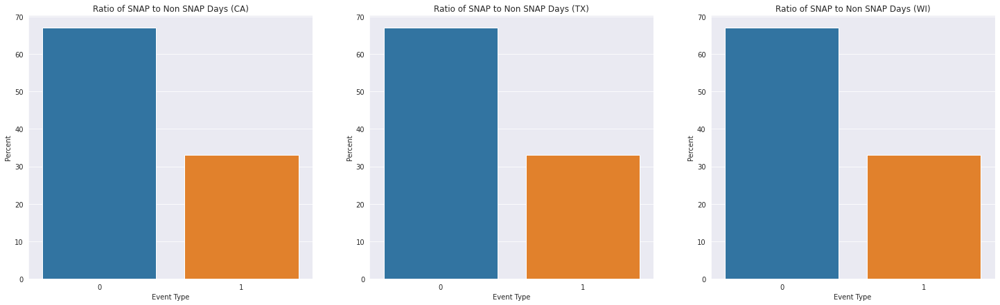

In [ ]:
sns.set_style('darkgrid')

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(25,7))

query_df = df_cal['snap_CA'].value_counts(normalize=True).mul(100).reset_index()
sns.barplot(x=query_df['index'], y=query_df['snap_CA'], ax=ax[0])
ax[0].set(title='Ratio of SNAP to Non SNAP Days (CA)', xlabel='Event Type', ylabel='Percent')

query_df = df_cal['snap_TX'].value_counts(normalize=True).mul(100).reset_index()
sns.barplot(x=query_df['index'], y=query_df['snap_TX'], ax=ax[1])
ax[1].set(title='Ratio of SNAP to Non SNAP Days (TX)', xlabel='Event Type', ylabel='Percent')

query_df = df_cal['snap_WI'].value_counts(normalize=True).mul(100).reset_index()
sns.barplot(x=query_df['index'], y=query_df['snap_WI'], ax=ax[2])
ax[2].set(title='Ratio of SNAP to Non SNAP Days (WI)', xlabel='Event Type', ylabel='Percent')

plt.show()

Observations: 
- The ratio of SNAP to Non-SNAP days is the same for all states - 1:2

In [ ]:
query_df = df_sales.groupby(['state_id', 'cat_id']).sum().T
query_df['snap_CA'] = df_cal['snap_CA'].iloc[:1913].tolist()
query_df['snap_TX'] = df_cal['snap_TX'].iloc[:1913].tolist()
query_df['snap_WI'] = df_cal['snap_WI'].iloc[:1913].tolist()
query_df.head(3)

state_id       CA                        TX                        WI          \
cat_id      FOODS HOBBIES HOUSEHOLD   FOODS HOBBIES HOUSEHOLD   FOODS HOBBIES   
d_1       10101.0  1802.0    2292.0  6853.0   879.0    1706.0  6224.0  1083.0   
d_2        9862.0  1561.0    2382.0  7030.0   870.0    1730.0  5866.0   926.0   
d_3        6944.0  1472.0    1692.0  5124.0   526.0    1128.0  5106.0   684.0   

state_id           snap_CA snap_TX snap_WI  
cat_id   HOUSEHOLD                          
d_1         1691.0       0       0       0  
d_2         1522.0       0       0       0  
d_3         1107.0       0       0       0

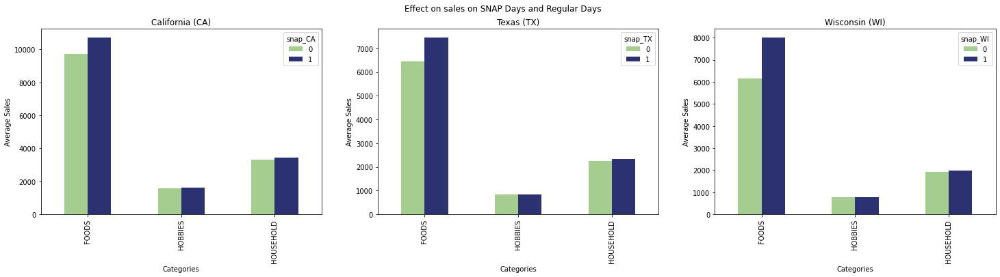

In [ ]:
query_df_ca = query_df[['CA', 'snap_CA']].groupby(by='snap_CA').mean().T
query_df_tx = query_df[['TX', 'snap_TX']].groupby(by='snap_TX').mean().T
query_df_wi = query_df[['WI', 'snap_WI']].groupby(by='snap_WI').mean().T

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize=(25,5))
fig.suptitle('Effect on sales on SNAP Days and Regular Days')

query_df_ca.plot(kind='bar', cmap='crest', ax=ax[0])
ax[0].set(title='California (CA)', xlabel='Categories', ylabel='Average Sales')
ax[0].set_xticklabels(query_df_ca.index.levels[1])

query_df_tx.plot(kind='bar', cmap = 'crest', ax=ax[1])
ax[1].set(title='Texas (TX)', xlabel='Categories', ylabel='Average Sales')
ax[1].set_xticklabels(query_df_tx.index.levels[1])

query_df_wi.plot(kind='bar', cmap='crest', ax=ax[2])
ax[2].set(title='Wisconsin (WI)', xlabel='Categories', ylabel='Average Sales')
ax[2].set_xticklabels(query_df_wi.index.levels[1])

plt.show()

Observations: 
- Since SNAP is an initiative to increase accessibility of food items to population of the US, we can see that it majorly affects the average sales of FOODS category products in all 3 states.
- WI sees 33% increase in average sales on SNAP days which is the highest among the states followed by TX which sees a 17% increase in average sales and lastly CA with 7% increase in average sales.

# 4.6 Effect of Holidays on Sales

In [ ]:
query_df = df_cal[['event_type']]
query_df.index = df_cal['date']
event_type = query_df['event_type'].astype('category')
event_typeDict = dict(enumerate(event_type.cat.categories))
query_df['event_type'] = query_df['event_type'].astype('category').cat.codes
query_df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,event_type
date,
2011-01-29,3
2011-01-30,3
2011-01-31,3
2011-02-01,3
2011-02-02,3


In [ ]:
print(event_typeDict)

{0: 'Cultural', 1: 'Cultural_Religious', 2: 'National', 3: 'NoEvent', 4: 'Religious', 5: 'Religious_Cultural', 6: 'Sporting', 7: 'Sporting_Cultural'}


In [ ]:
fig = px.imshow(query_df.T)

fig.update_layout(
    title='Visualizing Occurence of Different Event Types', xaxis_title='Date',
                  yaxis_title='Event Type', paper_bgcolor="ivory")
fig.show()

In [ ]:
query_df = df_cal[['event_name']]
query_df.index = df_cal['date']
event_name = query_df['event_name'].astype('category')
event_nameDict = dict(enumerate(event_name.cat.categories))
query_df['event_name'] = query_df['event_name'].astype('category').cat.codes
query_df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,event_name
date,
2011-01-29,21
2011-01-30,21
2011-01-31,21
2011-02-01,21
2011-02-02,21


In [ ]:
print(event_nameDict)

{0: 'ChanukahEnd', 1: 'Christmas', 2: 'CincoDeMayo', 3: 'ColumbusDay', 4: 'Easter', 5: 'Easter_OrthodoxEaster', 6: 'EidAlAdha', 7: 'Eidal-Fitr', 8: "Father'sday", 9: 'Halloween', 10: 'IndependenceDay', 11: 'LaborDay', 12: 'LentStart', 13: 'LentWeek2', 14: 'MartinLutherKingDay', 15: 'MemorialDay', 16: "Mother'sday", 17: 'NBAFinalsEnd', 18: "NBAFinalsEnd_Father'sday", 19: 'NBAFinalsStart', 20: 'NewYear', 21: 'NoEvent', 22: 'OrthodoxChristmas', 23: 'OrthodoxEaster', 24: 'OrthodoxEaster_CincoDeMayo', 25: 'OrthodoxEaster_Easter', 26: 'PesachEnd', 27: 'PresidentsDay', 28: 'PurimEnd', 29: 'Ramadanstarts', 30: 'StPatricksDay', 31: 'SuperBowl', 32: 'Thanksgiving', 33: 'ValentinesDay', 34: 'VeteransDay'}


In [ ]:
fig = px.imshow(query_df.T)

fig.update_layout(
    title='Visualizing Occurence of Different Events', xaxis_title='Date',
                  yaxis_title='Event', paper_bgcolor="ivory")
fig.show()

In [ ]:
query_df = df_cal[df_cal['event_type']!='NoEvent']['event_type'].value_counts(normalize=True).mul(100).reset_index()
query_df

,index,event_type
0,Religious,32.716049
1,National,32.098765
2,Cultural,22.222222
3,Sporting,9.876543
4,Religious_Cultural,1.234568
5,Sporting_Cultural,1.234568
6,Cultural_Religious,0.617284


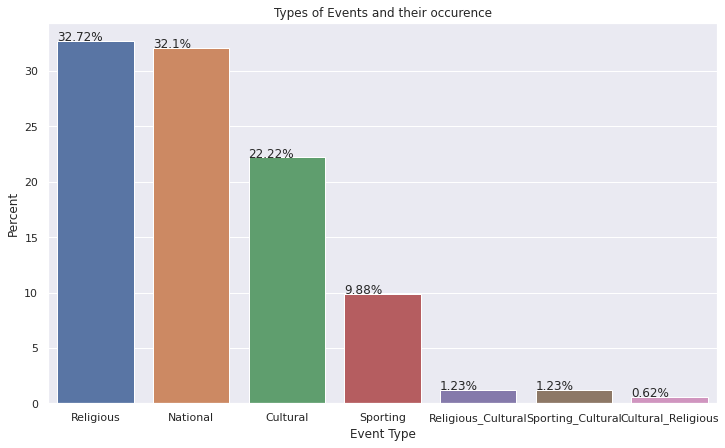

In [ ]:
plt.figure(figsize=(12,7))
ax = sns.barplot(x=query_df['index'], y=query_df['event_type'])
ax.set(title='Types of Events and their occurence', xlabel='Event Type', ylabel='Percent')
for p in ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    ax.text(txt_x,txt_y,txt)
plt.show()

Observations: 
- Majorly occuring event types are Religious and National. 
- Days where 2 event types occur on the same day like Cultural_Religious, Religious_Cultural, Sporting_Cultural are very less in number.

In [ ]:
query_df = df_sales.groupby(['state_id', 'cat_id']).sum().T
query_df['event_name'] = df_cal['event_name'].iloc[:1913].tolist()
query_df['event_type'] = df_cal['event_type'].iloc[:1913].tolist()
query_df.head()

state_id       CA                        TX                        WI          \
cat_id      FOODS HOBBIES HOUSEHOLD   FOODS HOBBIES HOUSEHOLD   FOODS HOBBIES   
d_1       10101.0  1802.0    2292.0  6853.0   879.0    1706.0  6224.0  1083.0   
d_2        9862.0  1561.0    2382.0  7030.0   870.0    1730.0  5866.0   926.0   
d_3        6944.0  1472.0    1692.0  5124.0   526.0    1128.0  5106.0   684.0   
d_4        7864.0  1405.0    1778.0  5470.0   809.0    1102.0  5544.0   455.0   
d_5        7178.0  1181.0    1566.0  4602.0   501.0     809.0  2823.0   132.0   

state_id           event_name event_type  
cat_id   HOUSEHOLD                        
d_1         1691.0    NoEvent    NoEvent  
d_2         1522.0    NoEvent    NoEvent  
d_3         1107.0    NoEvent    NoEvent  
d_4          985.0    NoEvent    NoEvent  
d_5          354.0    NoEvent    NoEvent

In [ ]:
query_df_ca = query_df[['CA', 'event_type']].groupby(by='event_type').mean().T
query_df_tx = query_df[['TX', 'event_type']].groupby(by='event_type').mean().T
query_df_wi = query_df[['WI', 'event_type']].groupby(by='event_type').mean().T

In [ ]:
for cat in query_df_ca.index.levels[1].tolist()[:-1]:
   query_df_ca.loc[('CA', cat),:] -=  query_df_ca.loc[('CA', cat),'NoEvent']

for cat in query_df_tx.index.levels[1].tolist()[:-1]:
   query_df_tx.loc[('TX', cat),:] -=  query_df_tx.loc[('TX', cat),'NoEvent']

for cat in query_df_wi.index.levels[1].tolist()[:-1]:
   query_df_wi.loc[('WI', cat),:] -=  query_df_wi.loc[('WI', cat),'NoEvent']

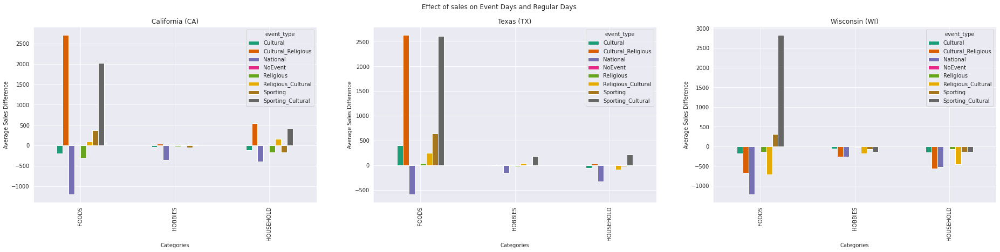

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize=(32,6))
fig.suptitle('Effect of sales on Event Days and Regular Days')

query_df_ca.plot(kind='bar', cmap='Dark2', ax=ax[0])
ax[0].set(title='California (CA)', xlabel='Categories', ylabel='Average Sales Difference')
ax[0].set_xticklabels(query_df_ca.index.levels[1])

query_df_tx.plot(kind='bar', cmap = 'Dark2', ax=ax[1])
ax[1].set(title='Texas (TX)', xlabel='Categories', ylabel='Average Sales Difference')
ax[1].set_xticklabels(query_df_tx.index.levels[1])

query_df_wi.plot(kind='bar', cmap='Dark2', ax=ax[2])
ax[2].set(title='Wisconsin (WI)', xlabel='Categories', ylabel='Average Sales Difference')
ax[2].set_xticklabels(query_df_wi.index.levels[1])

plt.show()

Observations: 
- Cultural_Religious, Sporting_Cultural and Sporting event types in CA depict the highest positive impact on average sales in FOODS and HOUSEHOLD categories compared to NoEvent. National event type shows the highest negative impact on sales in CA across categories.
- Cultural_Religious, Sporting_Cultural and Sporting event types in TX depict the highest positive impact on average sales in FOODS category compared to NoEvent. Sporting_Cultural event type also depicts a positive impact on HOBBIES, HOUSEHOLD categories average sales. National event type shows the highest negative impact on sales in TX across categories.
- Sporting_Cultural and Sporting event type in WI depict the highest positive impact on average sales in FOODS categoriy compared to NoEvent. National and Cultural_Religious event type shows the highest negative impact on sales in WI across categories.

## 4.7 Price Distribution and Sales

In [ ]:
df_price['id'] = df_price[['item_id','store_id']].apply(lambda x: str(x[0])+'_'+str(x[1])+'_validation', axis=1) 
df_price['cat_id'] = df_price['item_id'].apply(lambda x: x.split('_')[0])
df_price.head(1)

,store_id,item_id,wm_yr_wk,sell_price,id,cat_id
0,CA_1,HOBBIES_1_001,11325,9.578125,HOBBIES_1_001_CA_1_validation,HOBBIES


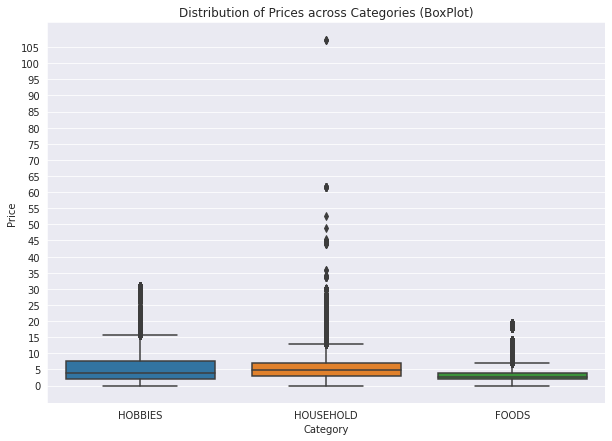

In [ ]:
plt.figure(figsize=(10,7))
ax = sns.boxplot(data = df_price, x='cat_id', y='sell_price')
ax.set(title='Distribution of Prices across Categories (BoxPlot)', xlabel='Category', ylabel='Price')
ax.set_yticks(np.arange(0, 110, 5))
plt.show()

Observations:
- Above plot depicts the distribution of prices in a category considering all weeks. 
- FOODS category products have the lowest prices with 50% product prices lying in the range 2.5-5 USD. Highest priced product in FOODS is around 22 USD.
- 50% of HOUSEHOLD category product prices lie in the range 3-7.5 USD. Highest priced product in HOUSEHOLD is around 107 USD.
- 50% of HOBBIES category product prices lie in the range 2-8 USD. Highest priced product in HOBBIES is around 32 USD.

> Least and Most Sold items in each category



In [ ]:
df_sales['total_sold'] = df_sales[[f'd_{day}' for day in range(1, 1914)]].sum(axis=1)
df_sales.head(1)

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913,total_sold
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,3,0,1,1,1,3,0,1,1,600


In [ ]:
query_df = df_sales[df_sales['cat_id']=='FOODS'][['id', 'total_sold']]
print('Least and Most sold item in FOODS:\n')
print(query_df[(query_df['total_sold']==query_df.total_sold.max()) | (query_df['total_sold']==query_df.total_sold.min())].sort_values('total_sold'))

Least and Most sold item in FOODS:

                               id  total_sold
6048  FOODS_3_778_CA_2_validation          12
8412  FOODS_3_090_CA_3_validation      250502


In [ ]:
query_df = df_sales[df_sales['cat_id']=='HOBBIES'][['id', 'total_sold']]
print('Least and Most sold item in HOBBIES:\n')
print(query_df[(query_df['total_sold']==query_df.total_sold.max()) | (query_df['total_sold']==query_df.total_sold.min())].sort_values('total_sold'))

Least and Most sold item in HOBBIES:

                                  id  total_sold
27606  HOBBIES_1_170_WI_3_validation          13
6324   HOBBIES_1_234_CA_3_validation       29742


In [ ]:
query_df = df_sales[df_sales['cat_id']=='HOUSEHOLD'][['id', 'total_sold']]
print('Least and Most sold item in HOUSEHOLD:\n')
print(query_df[(query_df['total_sold']==query_df.total_sold.max()) | (query_df['total_sold']==query_df.total_sold.min())].sort_values('total_sold'))

Least and Most sold item in HOUSEHOLD:

                                   id  total_sold
6682  HOUSEHOLD_1_020_CA_3_validation          10
6776  HOUSEHOLD_1_118_CA_3_validation       43351


In [ ]:
df_sales.drop(columns=['total_sold'], inplace=True)

> Sales and Prices of the Most Sold items in each category.


In [ ]:
#Inspecting sales and prices time series data of most sold foods product 
query_df = df_sales.loc[df_sales['id']=='FOODS_3_090_CA_3_validation']
query_df = query_df.drop(columns=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']).T
query_df.columns = ['sales']
query_df['wm_yr_wk'] = df_cal['wm_yr_wk'][:1913].tolist()
query_df = query_df.merge(df_price[df_price['id']=='FOODS_3_090_CA_3_validation'][['wm_yr_wk', 'sell_price']], on='wm_yr_wk', how='left')
query_df.index = df_cal['date'][:1913] 
query_df.head()

,sales,wm_yr_wk,sell_price
date,,,
2011-01-29,108,11101,1.25
2011-01-30,132,11101,1.25
2011-01-31,102,11101,1.25
2011-02-01,120,11101,1.25
2011-02-02,106,11101,1.25


In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(
    go.Scatter(x=query_df.index, y=query_df.sales, name='Sales'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=query_df.index, y=query_df.sell_price, name='Price'),
    row=2, col=1
)

fig.update_layout(title_text="Sales and Price Time Series of FOODS_3_090_CA_3_validation", paper_bgcolor="ivory")
fig.show()

Observations: 
- Price keeps fluctuating every few months.
- Sales show some inverse relation to the price in some period, fall in prices leads to rise in sales and vice versa (Oct'2011 - Dec'2013) and in some period the relation is directly proportional (Jan'2014 - Apr'2016).

In [ ]:
#Inspecting sales and prices time series data of most sold hobbies product 
query_df = df_sales.loc[df_sales['id']=='HOBBIES_1_234_CA_3_validation'] 
query_df = query_df.drop(columns=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']).T
query_df.columns = ['sales']
query_df['wm_yr_wk'] = df_cal['wm_yr_wk'][:1913].tolist()
query_df = query_df.merge(df_price[df_price['id']=='HOBBIES_1_234_CA_3_validation'][['wm_yr_wk', 'sell_price']], on='wm_yr_wk', how='left')
query_df.index = df_cal['date'][:1913] 
query_df.head()

,sales,wm_yr_wk,sell_price
date,,,
2011-01-29,0,11101,NaN
2011-01-30,0,11101,NaN
2011-01-31,0,11101,NaN
2011-02-01,0,11101,NaN
2011-02-02,0,11101,NaN


In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(
    go.Scatter(x=query_df.index, y=query_df.sales, name='Sales'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=query_df.index, y=query_df.sell_price, name='Price'),
    row=2, col=1
)

fig.update_layout(title_text="Sales and Price Time Series of HOBBIES_1_234_CA_3_validation", paper_bgcolor="ivory")
fig.show()

Observations: 
- There is no price data till 15th Oct'2011 indicating that product isn't introduced in the store. Price remains constant throughout the rest of the period.
- Sales does not show any relation to the price neither does it follow a trend or depict seasonality.

In [ ]:
#Inspecting sales and prices time series data of most sold household product 
query_df = df_sales.loc[df_sales['id']=='HOUSEHOLD_1_118_CA_3_validation']
query_df = query_df.drop(columns=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']).T
query_df.columns = ['sales']
query_df['wm_yr_wk'] = df_cal['wm_yr_wk'][:1913].tolist()
query_df = query_df.merge(df_price[df_price['id']=='HOUSEHOLD_1_118_CA_3_validation'][['wm_yr_wk', 'sell_price']], on='wm_yr_wk', how='left')
query_df.index = df_cal['date'][:1913] 
query_df.head()

,sales,wm_yr_wk,sell_price
date,,,
2011-01-29,17,11101,0.970215
2011-01-30,27,11101,0.970215
2011-01-31,28,11101,0.970215
2011-02-01,32,11101,0.970215
2011-02-02,24,11101,0.970215


In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

fig.add_trace(
    go.Scatter(x=query_df.index, y=query_df.sales, name='Sales'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=query_df.index, y=query_df.sell_price, name='Price'),
    row=2, col=1
)

fig.update_layout(title_text="Sales and Price Time Series of HOUSEHOLD_1_118_CA_3_validation", paper_bgcolor="ivory")
fig.show()

Observations: 
- Price is constant throughout the weeks.
- Sales does not show any relation to the price neither does it follow a trend or depict seasonality.

# 5. References

- https://www.sciencedirect.com/science/article/pii/S0169207021001874 (Understanding data and evaluation metric)
- https://arxiv.org/pdf/2108.03588.pdf (Understanding evaluation metric)
- https://www.analyticsvidhya.com/blog/2021/10/a-comprehensive-guide-to-time-series-analysis/ (TSA Guide)
- https://towardsdatascience.com/visualize-hierarchical-data-using-plotly-and-datapane-7e5abe2686e1 (Visualize Heirarchical Data)
- https://plotly.com/python/time-series/ (Plotly TSA)
